<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230508.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)

# 준비
+ synthetic data를 만든다.
+ 해당 data는 importance가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다. 

## synthetic data의 생성

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 importance

In [4]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [5]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

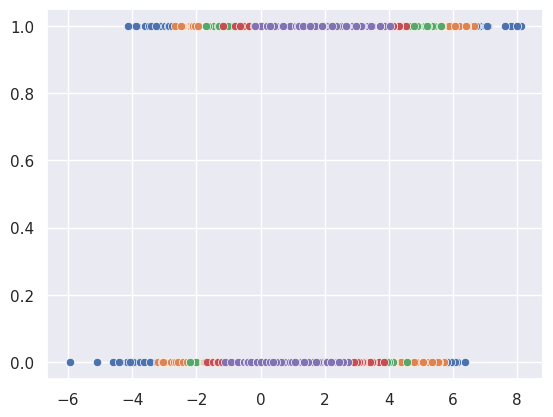

In [6]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    sns.scatterplot(x=x[:,ix],y=y)

<Axes: >

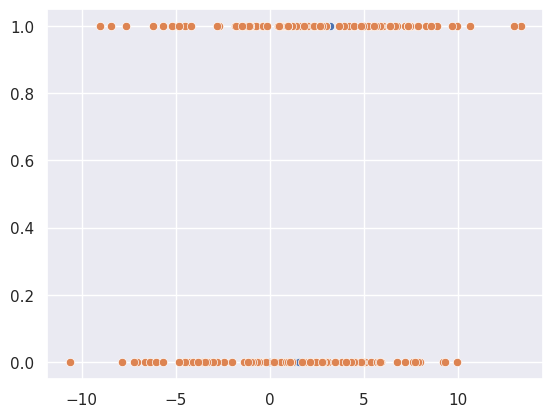

In [7]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)    
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
sns.scatterplot(x=x[0:200,4],y=y[0:200])
sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

## Mutual Information의 측정

In [8]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [9]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


### Bucket 별 MI 측정

+ Bucket을 10, 50, 100 으로 나눠서

Bucket size 10


100%|██████████| 10/10 [00:00<00:00, 10.08it/s]


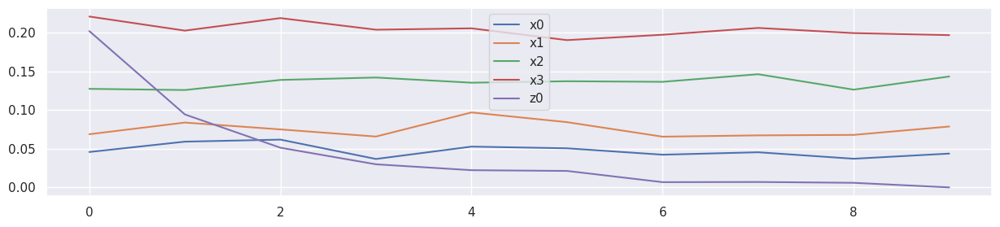

Bucket size 50


100%|██████████| 50/50 [00:01<00:00, 43.54it/s]


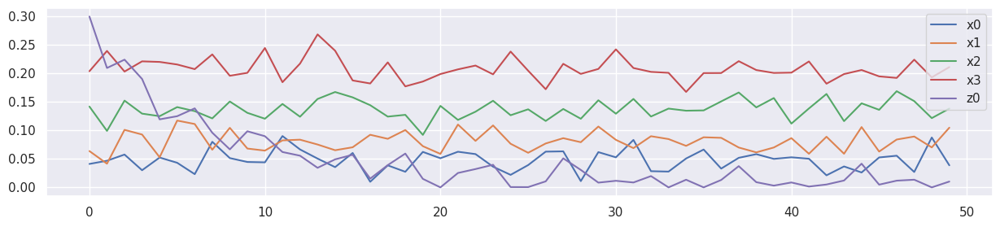

Bucket size 100


100%|██████████| 100/100 [00:01<00:00, 68.48it/s]


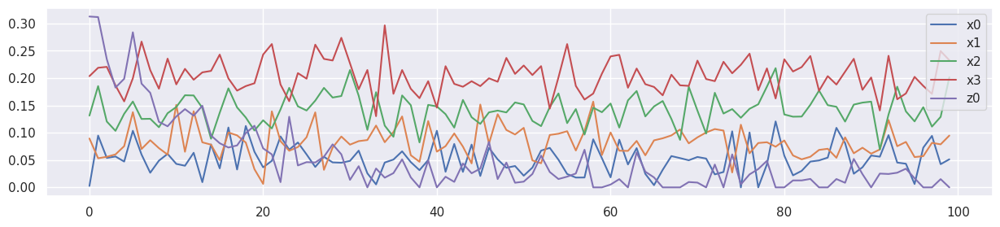

Bucket size 200


100%|██████████| 200/200 [00:02<00:00, 91.60it/s]


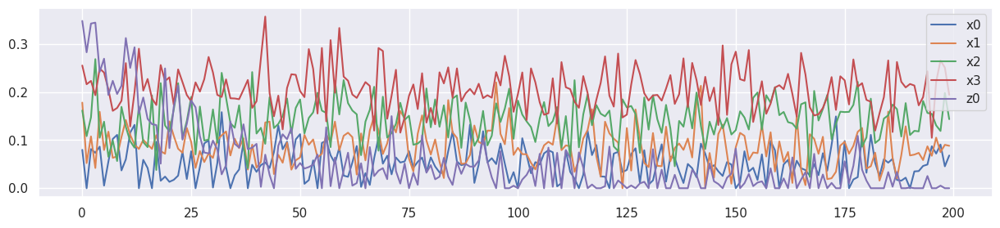

In [10]:
from tqdm import tqdm

bucket_size_array=[10,50,100,200]

for bucket_size in bucket_size_array:
    #bucket_size = 10
    print('Bucket size',bucket_size)
    MIS = {}
    for col in columns:
        MIS[col] = []

    step_size = int(x.shape[0]/bucket_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*step_size:bk*step_size+step_size], y[bk*step_size:bk*step_size+step_size], discrete_features="auto")
        for col in columns:
            MIS[col].append(mi_scores[col]) 

    df_mis = pd.DataFrame(MIS)
    df_mis.plot(figsize=(15,3))
    plt.show()

+ 상기 실험에서, z0의 MI는 bucket의 증가에 따라, 낮아지는 것을 확인할 수 있다.

# Deep architecture에 의한 y의 추정 실험

+ 2000개를 학습하고, 이후 38000개를 추정한다.

## 학습데이터, 2000개 내 bucket 20개의 importance 변화

100%|██████████| 20/20 [00:00<00:00, 110.86it/s]


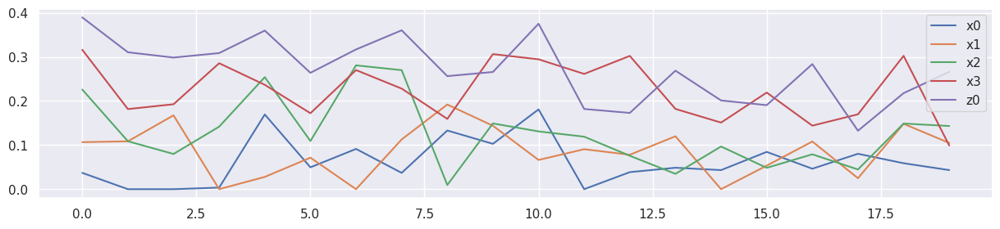

In [11]:
MIS = {}
for col in columns:
    MIS[col] = []
        
for bk in tqdm(range(20)):
    bx = X[bk*100:(bk+1)*100]
    by = y[bk*100:(bk+1)*100]
    mi_scores = make_mi_scores(bx, by, discrete_features="auto")
    for col in columns:
        MIS[col].append(mi_scores[col]) 

df_mis = pd.DataFrame(MIS)
df_mis.plot(figsize=(15,3))
plt.show()

## feature 5개를 모두 포함한 학습

100%|██████████| 1000/1000 [00:19<00:00, 52.33it/s]


MSE: 0.26
RMSE: 0.51


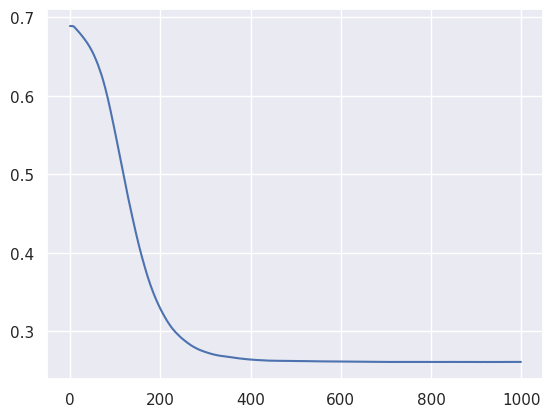

In [12]:
import copy
import torch.optim as optim
 
seed_everything()

# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

+ F1 측정

+ 비교 대상의 측정치

In [13]:
result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

In [14]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

feature 5, test_f1 0.8685714285714285


+ 2000~40000까지의 R-squared score 측정 

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 593.17it/s]


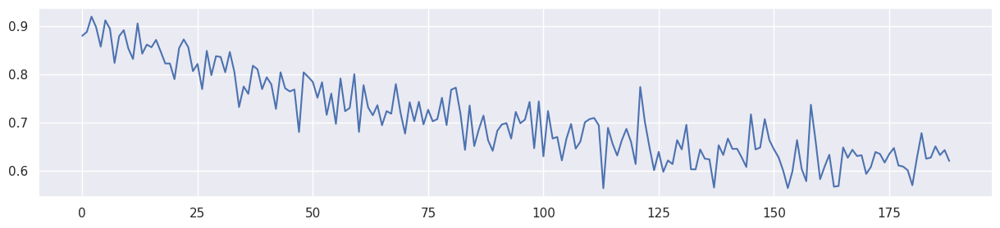

{'lambda': ['Feature 5'], 'test_f1': [0.8685714285714285], 'init_f1': [0.8796296296296295], 'mean_f1': [0.7098741213305322], 'last_f1': [0.6203703703703703], 'MI(y^,z)': [0.24555153464098023]}


In [15]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

print(result_table3)


## feature 5개 + bucket(B) = feature 6개를 학습

In [16]:
# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


100%|██████████| 1000/1000 [00:19<00:00, 52.24it/s]


MSE: 0.26
RMSE: 0.51


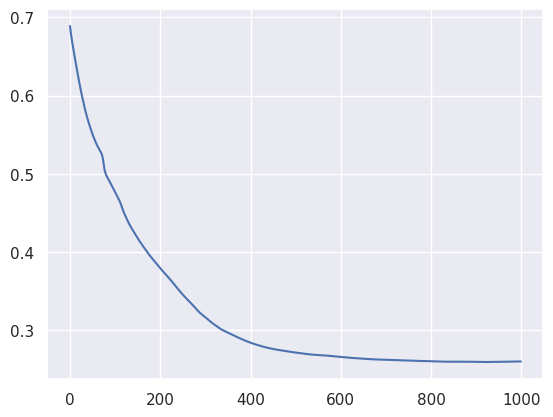

In [17]:
seed_everything()

X_train = torch.tensor(X[0:1800].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(6, 24),
    nn.ReLU(),
    nn.Linear(24, 6),
    nn.ReLU(),
    nn.Linear(6, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [18]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.872093023255814


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 558.55it/s]


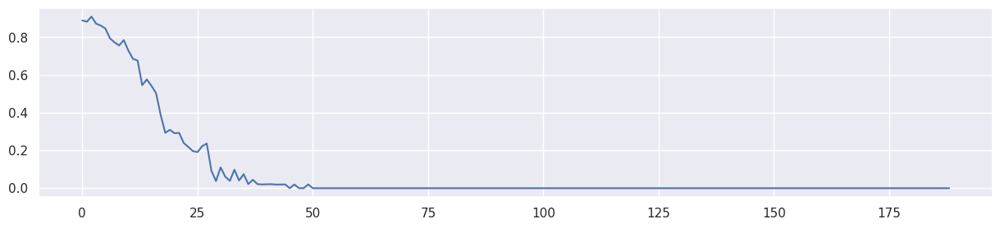

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.87963,0.709874,0.62037,0.245552
1,Feature 6,0.872093,0.88785,0.086206,0.00000,0.231248


In [19]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0','b']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 6')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

## z0를 빼고, 4개 feature로 학습

100%|██████████| 1000/1000 [00:18<00:00, 53.82it/s]


MSE: 0.13
RMSE: 0.36


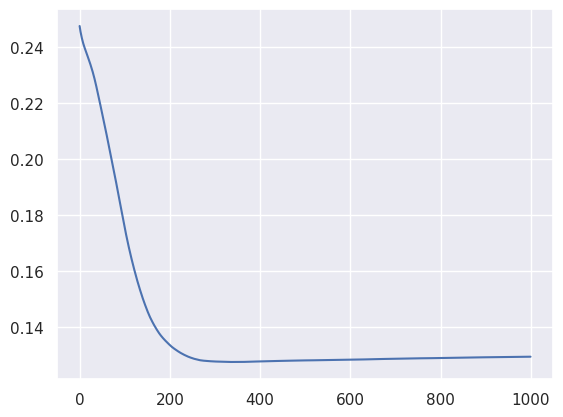

In [20]:
seed_everything()

X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(4, 16),
    nn.ReLU(),
    nn.Linear(16, 4),
    nn.ReLU(),
    nn.Linear(4, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.MSELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100 # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [21]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.7840909090909092


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 584.86it/s]


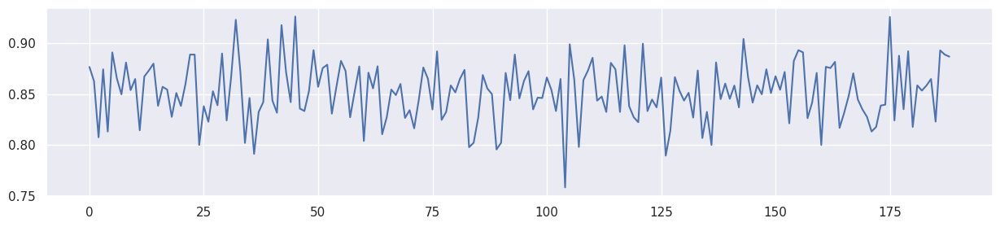

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256


In [22]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(X[1800:2000][['z0']], predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 4')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

+ 위에서 보면.... 학습과정에서, 현재는 학습에 효과가 있지만 향후 잠재적으로 성능을 저해할 수 있는 feature를 탐지하여 이의 효과를 경감 또는 (보정) 할 수 있는 학습 방법을 찾아야 하는 것!!!

## RF-Train의 적용

+ 위의 데이터에서, sensitive attribute는 z0에 대당된다.
+ 따라서, MI(y^|z0) = 0 이되어야 하고,
+ Fairness discriminator에서는  Y^과 z0의 loss가 커야 한다! 즉, 최대한 상관 없어야 한다.
+ OK, 일단 이렇게 구성해 본다!

In [23]:
!git clone https://github.com/yuji-roh/fr-train.git

Cloning into 'fr-train'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 31 (delta 9), reused 4 (delta 0), pack-reused 0
Unpacking objects: 100% (31/31), 168.32 KiB | 1.43 MiB/s, done.


In [24]:
%cd fr-train
!pwd

/content/fr-train
/content/fr-train


In [25]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

+ Generator의 구현 = 위에서 feature 5개의 model과 동일
+ DiscriminatorF = Y^과 z0가 같아지지 않게 학습 ??

In [26]:

def test_model(model_, tX, ty, s1):
    """Tests the performance of a model.

    Args:
        model_: A model to test.
        X: Input features of test data.
        y: True label (1-D) of test data.
        s1: Sensitive attribute (1-D) of test data.

    Returns:
        The test accuracy and disparate impact of the model.
    """
    
    model_.eval()
    
    y_hat = model_(tX)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [27]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).
    
    This class is for defining the structure of FR-Train generator (classifier). 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted label (y_hat) for the given input data.
        """
        
        output = self.model(input_data)
        return output

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 8),
            nn.Linear(8, 1),
            nn.Sigmoid()            
        )

    def forward(self, x1, x2):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(torch.cat((x1, x2), 1))
        return predicted_z
    

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF2(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF2, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(1, 4),
            nn.Linear(4, 1)       
        )

    def forward(self, x1):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(x1)
        return predicted_z
    

In [28]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    #mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.SGD(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_loss.backward()
        g_losses.append(g_loss)
        optimizer_G.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1, mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1, mi, generator

In [29]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model2(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 
        #r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        #f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        d_f_loss =  (r_loss + f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [30]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model22(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF2()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 

        # y와 z는 상관관계가 있으므로... r_loss는 최소화 시키고...
        r_loss = mse_loss(discriminator_F(y_train.reshape(-1,1)), s1_train.reshape(-1,1))
        # y^와 z는 최대한 무관하게... f_loss 최대화 시킨다..
        f_loss = mse_loss(discriminator_F(gen_y), s1_train.reshape(-1,1)) * 0.3

        d_f_loss =  (r_loss - f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [31]:
def test_all_data(generator):

    XT = X[2000:][['x0','x1','x2','x3','z0']]
    yT = y[2000:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474273]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437781]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402506]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369965]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341810]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317959]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 583.68it/s]


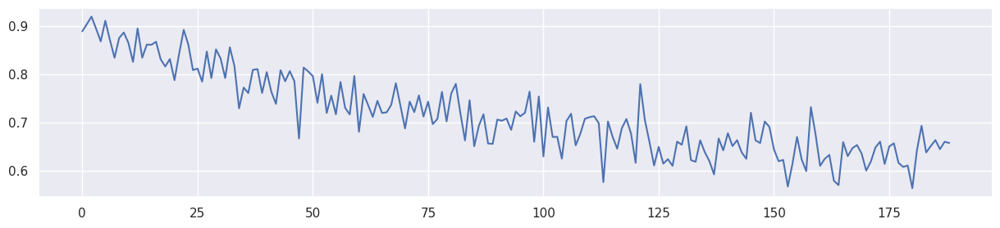

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 0.764362]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 1.385715] [G loss: 0.748424]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 1.379816] [G loss: 0.721642]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 1.369719] [G loss: 0.692447]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 1.361597] [G loss: 0.661667]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 1.359293] [G loss: 0.629466]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 1.361001] [G loss: 0.596741]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 1.364285] [G loss: 0.563744]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 1.368029] [G loss: 0.531376]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 1.371693] [G loss: 0.499893]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 1.375391] [G loss: 0.471104]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 1.378541] [G loss: 0.446025]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 569.95it/s]


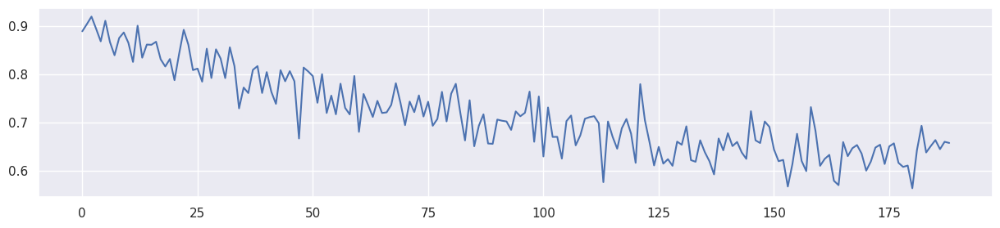

Mean F1 for all data: 0.7170752811002495
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 0.833470]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 1.385707] [G loss: 0.819187]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 1.379258] [G loss: 0.794397]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 1.366871] [G loss: 0.767057]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 1.356212] [G loss: 0.738834]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 1.352615] [G loss: 0.710249]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 1.354324] [G loss: 0.681624]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 1.358529] [G loss: 0.652855]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 1.363284] [G loss: 0.624683]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 1.367940] [G loss: 0.597247]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 1.372619] [G loss: 0.572237]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 1.376532] [G loss: 0.550378]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 569.33it/s]


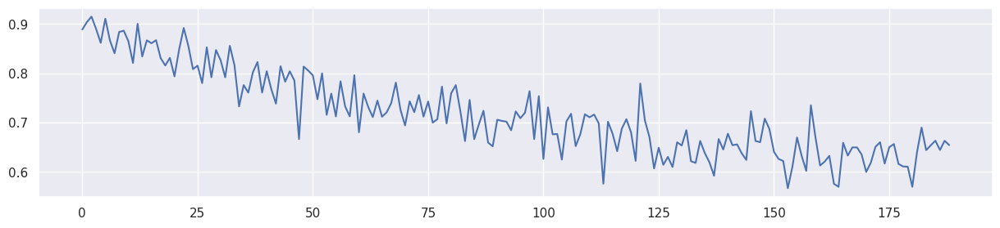

Mean F1 for all data: 0.7176960107442528
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 0.902577]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 1.385694] [G loss: 0.889952]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 1.378446] [G loss: 0.867016]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 1.362389] [G loss: 0.841007]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 1.346843] [G loss: 0.814998]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 1.340973] [G loss: 0.789855]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 1.342740] [G loss: 0.765414]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 1.347964] [G loss: 0.741051]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 1.354569] [G loss: 0.717223]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 1.361214] [G loss: 0.694206]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 1.367934] [G loss: 0.672915]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 1.373049] [G loss: 0.654381]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 587.84it/s]


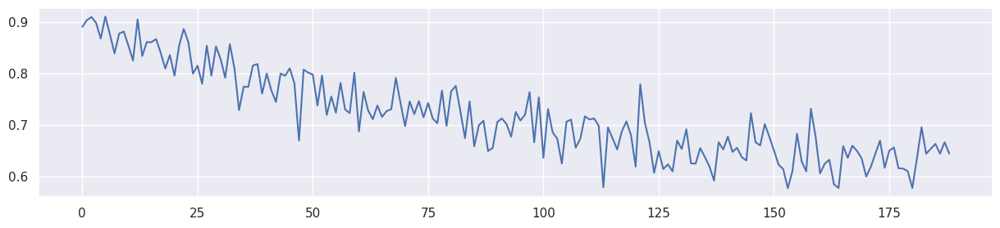

Mean F1 for all data: 0.7185592664472374
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 0.971684]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 1.385651] [G loss: 0.960716]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 1.377058] [G loss: 0.939390]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 1.354234] [G loss: 0.913654]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 1.329525] [G loss: 0.888927]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 1.318446] [G loss: 0.867105]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 1.319638] [G loss: 0.847040]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 1.326620] [G loss: 0.827323]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 1.335311] [G loss: 0.808170]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 1.345255] [G loss: 0.790189]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 1.355975] [G loss: 0.773466]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 1.364482] [G loss: 0.758701]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 587.56it/s]


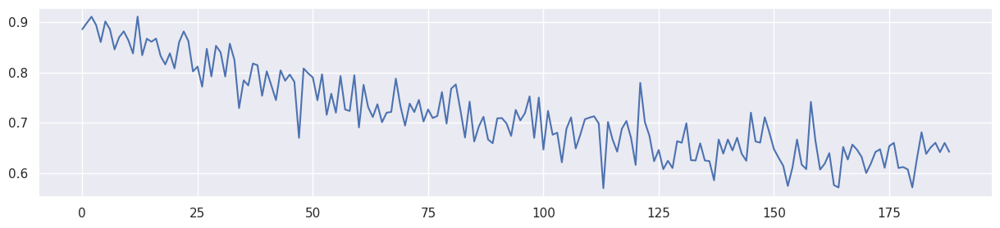

Mean F1 for all data: 0.716829862616852
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 1.040792]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 1.385086] [G loss: 1.031416]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 1.365266] [G loss: 1.010256]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 1.314786] [G loss: 0.982919]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 1.272525] [G loss: 0.960884]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 1.258224] [G loss: 0.943746]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 1.258621] [G loss: 0.928428]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 1.265445] [G loss: 0.913316]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 1.274780] [G loss: 0.899293]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 1.288391] [G loss: 0.886958]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 1.305207] [G loss: 0.875826]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 1.322714] [G loss: 0.865882]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F l

100%|██████████| 189/189 [00:00<00:00, 575.18it/s]


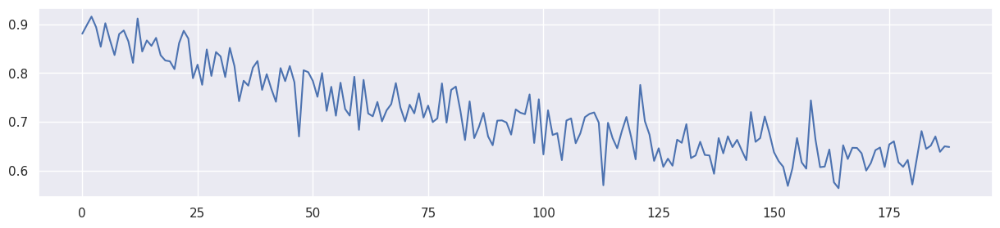

Mean F1 for all data: 0.7167127527365508
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 1.109899]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 1.384624] [G loss: 1.101906]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 1.359386] [G loss: 1.078351]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 1.286432] [G loss: 1.040596]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 1.209703] [G loss: 1.013609]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 1.178470] [G loss: 1.000641]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 1.171644] [G loss: 0.989958]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 1.170898] [G loss: 0.979577]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 1.171883] [G loss: 0.970392]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 1.174362] [G loss: 0.963220]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 1.180557] [G loss: 0.957649]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 1.187429] [G loss: 0.953300]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 544.82it/s]


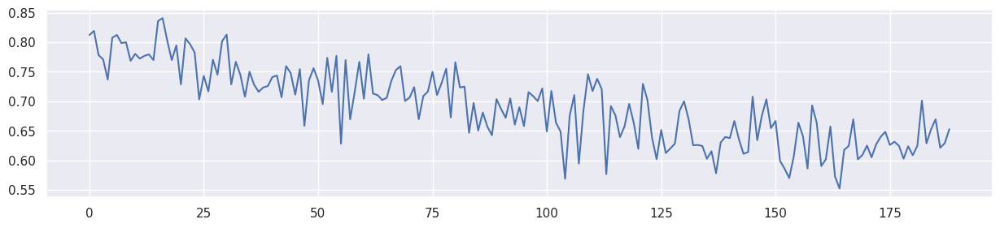

Mean F1 for all data: 0.6920815777961908
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 1.179006]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 1.384364] [G loss: 1.172318]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 1.352243] [G loss: 1.144222]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 1.258360] [G loss: 1.089529]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 1.159981] [G loss: 1.048331]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 1.106517] [G loss: 1.033059]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 1.087656] [G loss: 1.025751]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 1.081852] [G loss: 1.018620]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 1.079079] [G loss: 1.012759]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 1.078945] [G loss: 1.008387]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 1.079956] [G loss: 1.005195]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 1.082166] [G loss: 1.002947]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 575.99it/s]


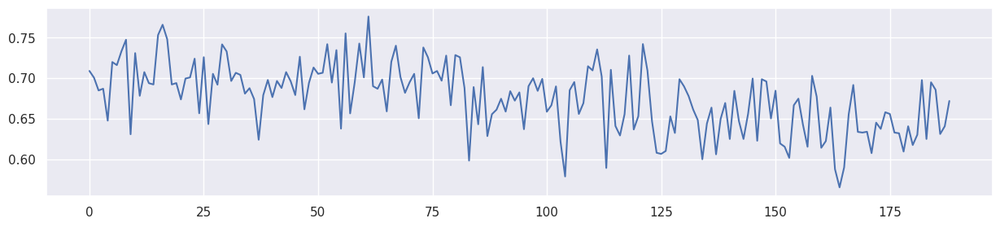

Mean F1 for all data: 0.6753588356134587
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 1.248114]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 1.383965] [G loss: 1.242565]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 1.342603] [G loss: 1.206555]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 1.228619] [G loss: 1.127630]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 1.110432] [G loss: 1.062805]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 1.041893] [G loss: 1.037911]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 1.013065] [G loss: 1.031554]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 1.004443] [G loss: 1.028972]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 1.003139] [G loss: 1.026490]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 1.004280] [G loss: 1.024115]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 1.005393] [G loss: 1.021932]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 1.006181] [G loss: 1.019991]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 575.04it/s]


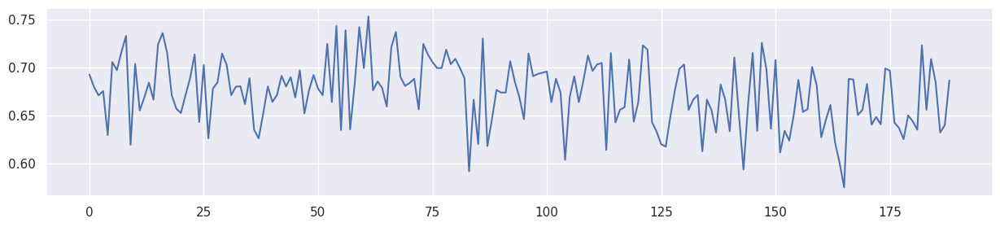

Mean F1 for all data: 0.6738530529835562
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 1.386328] [G loss: 1.317221]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 1.383212] [G loss: 1.312479]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 1.329523] [G loss: 1.263401]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 1.193672] [G loss: 1.150553]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 1.067594] [G loss: 1.057277]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.996381] [G loss: 1.015475]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.963313] [G loss: 1.003051]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.951129] [G loss: 1.000448]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.947176] [G loss: 0.999522]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.946042] [G loss: 0.998793]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.945847] [G loss: 0.998031]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: 0.945854] [G loss: 0.997296]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 575.83it/s]


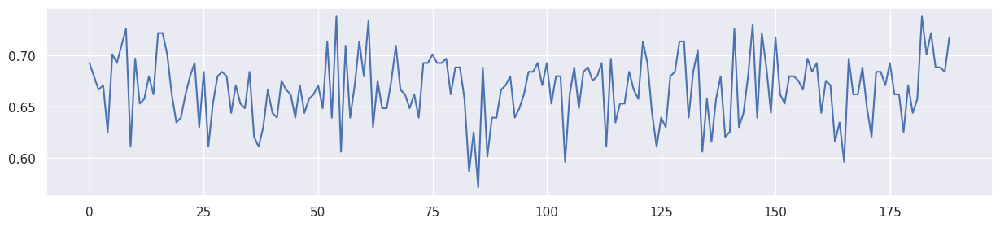

Mean F1 for all data: 0.6673744009113316


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,2.455515e-01
1,Feature 6,0.872093,0.887850,0.086206,0.000000,2.312480e-01
2,Feature 4,0.784091,0.876712,0.851969,0.886878,1.032558e-01
0,0.0,0.875000,0.888889,0.716996,0.657407,2.616669e-01
1,0.1,0.875000,0.888889,0.717075,0.657407,2.616669e-01
2,0.2,0.881356,0.888889,0.717696,0.654378,2.598196e-01
3,0.3,0.868571,0.890909,0.718559,0.644860,2.455515e-01
4,0.4,0.865169,0.885845,0.716830,0.642202,2.771431e-01
5,0.5,0.876404,0.880734,0.716713,0.648402,2.707110e-01
6,0.6,0.744589,0.812261,0.692082,0.652893,2.988178e-01


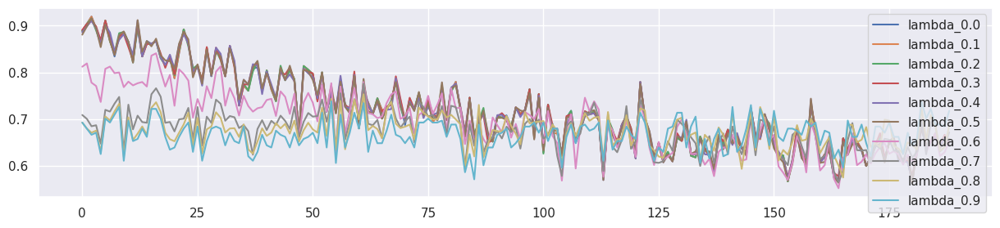

In [32]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model2(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474273]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437781]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402506]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369965]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341810]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317959]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 572.94it/s]


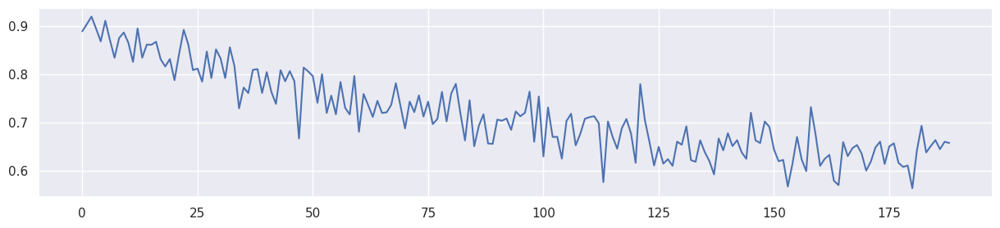

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.832770]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 0.833585] [G loss: 0.693393]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 0.213729] [G loss: 0.605726]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 0.195657] [G loss: 0.575629]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 0.201150] [G loss: 0.545888]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 0.207711] [G loss: 0.514309]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 0.215046] [G loss: 0.481998]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 0.222711] [G loss: 0.449594]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 0.230764] [G loss: 0.417634]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 0.238594] [G loss: 0.386566]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 0.245515] [G loss: 0.357750]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 0.251275] [G loss: 0.332951]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 591.57it/s]


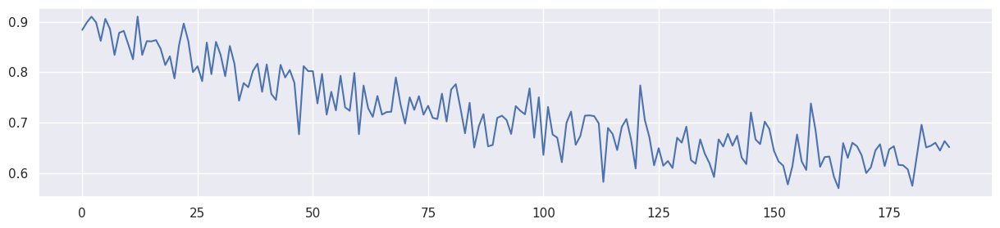

Mean F1 for all data: 0.7185566609919494
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.970285]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 0.833493] [G loss: 0.709108]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 0.213596] [G loss: 0.562590]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 0.195530] [G loss: 0.533671]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 0.200929] [G loss: 0.507758]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 0.207242] [G loss: 0.480435]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 0.214180] [G loss: 0.452573]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 0.221562] [G loss: 0.424577]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 0.229083] [G loss: 0.397316]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 0.236730] [G loss: 0.370483]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 0.243736] [G loss: 0.345590]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 0.249563] [G loss: 0.323892]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 590.31it/s]


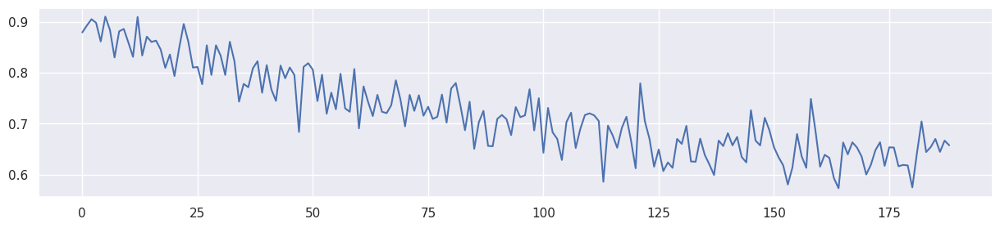

Mean F1 for all data: 0.7216342598590664
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.107801]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 0.833361] [G loss: 0.724797]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 0.213414] [G loss: 0.519434]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 0.195383] [G loss: 0.491674]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 0.200621] [G loss: 0.469555]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 0.206596] [G loss: 0.446452]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 0.213079] [G loss: 0.422978]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 0.219984] [G loss: 0.399436]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 0.226841] [G loss: 0.376687]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 0.234315] [G loss: 0.354238]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 0.241240] [G loss: 0.333452]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 0.247465] [G loss: 0.314807]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 587.75it/s]


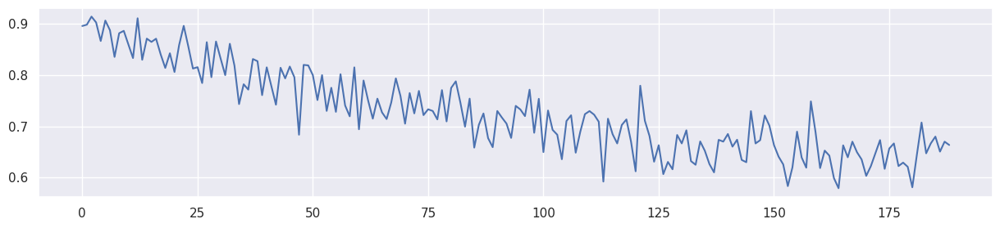

Mean F1 for all data: 0.7269675778448235
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.245316]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 0.833172] [G loss: 0.740447]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 0.213155] [G loss: 0.476251]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 0.195186] [G loss: 0.449649]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 0.200202] [G loss: 0.431314]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 0.205708] [G loss: 0.412349]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 0.211478] [G loss: 0.393117]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 0.217768] [G loss: 0.374099]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 0.224006] [G loss: 0.355630]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 0.230660] [G loss: 0.337731]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 0.237458] [G loss: 0.321210]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 0.243866] [G loss: 0.305842]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 597.13it/s]


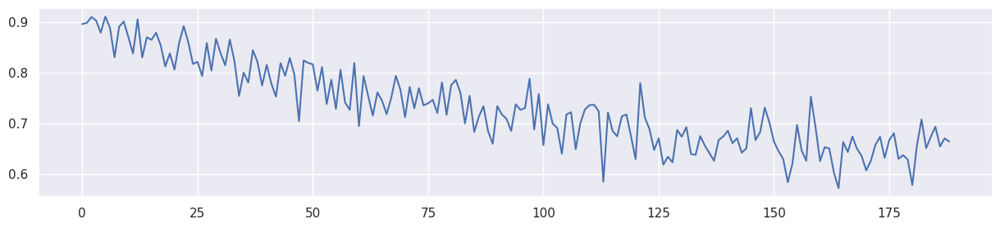

Mean F1 for all data: 0.7319763899719148
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.382831]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 0.832889] [G loss: 0.756029]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 0.212725] [G loss: 0.433048]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 0.194867] [G loss: 0.407642]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 0.199480] [G loss: 0.393084]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 0.204273] [G loss: 0.378121]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 0.209030] [G loss: 0.363057]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 0.214099] [G loss: 0.348410]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 0.219668] [G loss: 0.334297]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 0.225353] [G loss: 0.320795]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 0.231430] [G loss: 0.308606]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 0.237384] [G loss: 0.297326]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 550.56it/s]


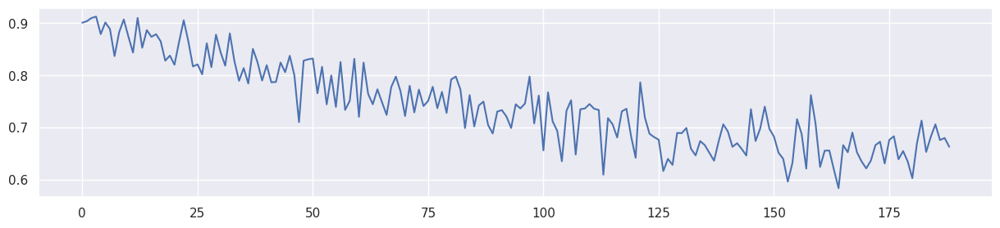

Mean F1 for all data: 0.7423708784087666
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.520346]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 0.832396] [G loss: 0.771489]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 0.211923] [G loss: 0.389839]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 0.194212] [G loss: 0.365749]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 0.198079] [G loss: 0.354855]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 0.201653] [G loss: 0.343617]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 0.204925] [G loss: 0.332331]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 0.208073] [G loss: 0.321580]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 0.211207] [G loss: 0.311396]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 0.214972] [G loss: 0.302308]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 0.219893] [G loss: 0.294440]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 0.225597] [G loss: 0.287040]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 577.02it/s]


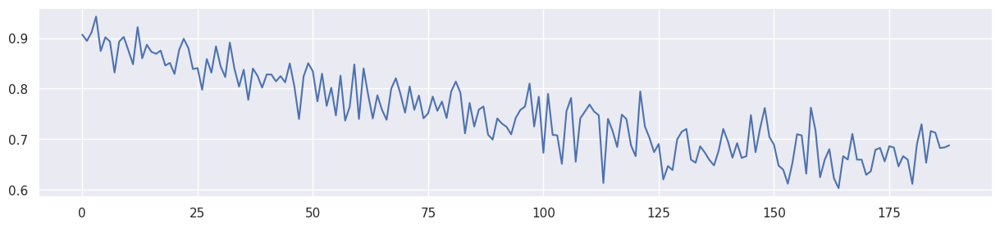

Mean F1 for all data: 0.7527575859274136
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.657862]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 0.831427] [G loss: 0.786655]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 0.210112] [G loss: 0.346536]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 0.192568] [G loss: 0.324029]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 0.194762] [G loss: 0.316384]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 0.195838] [G loss: 0.308375]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 0.196137] [G loss: 0.300296]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 0.195451] [G loss: 0.292440]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 0.194416] [G loss: 0.285362]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 0.194358] [G loss: 0.279568]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 0.195843] [G loss: 0.275178]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 0.198860] [G loss: 0.271833]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 564.60it/s]


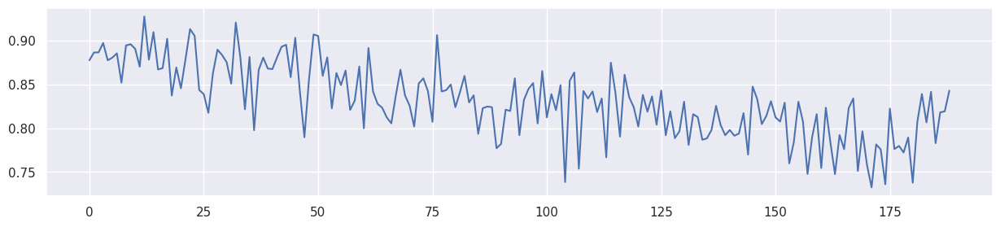

Mean F1 for all data: 0.8317235320413001
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.795377]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 0.829699] [G loss: 0.801038]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 0.205401] [G loss: 0.301996]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 0.186129] [G loss: 0.281527]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 0.185560] [G loss: 0.276170]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 0.180609] [G loss: 0.269275]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 0.168396] [G loss: 0.259846]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 0.153192] [G loss: 0.250935]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 0.138238] [G loss: 0.244367]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 0.126286] [G loss: 0.240322]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 0.118502] [G loss: 0.238091]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 0.113226] [G loss: 0.236786]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 571.46it/s]


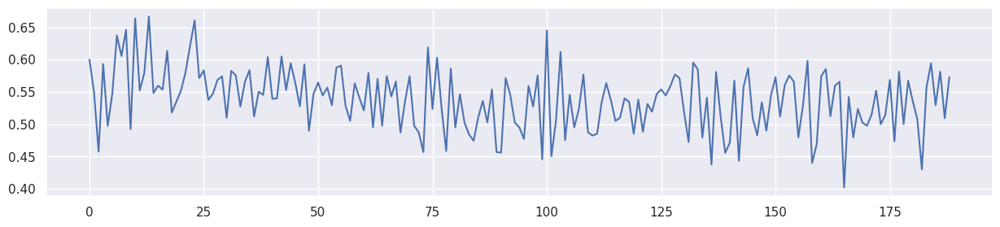

Mean F1 for all data: 0.5379336032555441
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.932892]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 0.826662] [G loss: 0.813539]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 0.199632] [G loss: 0.251200]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 0.174581] [G loss: 0.230232]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 0.165154] [G loss: 0.224741]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.148569] [G loss: 0.214766]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.124850] [G loss: 0.198967]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.095280] [G loss: 0.179876]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.062169] [G loss: 0.161178]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.031257] [G loss: 0.146792]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.006739] [G loss: 0.137536]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: -0.010526] [G loss: 0.131840]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F

100%|██████████| 189/189 [00:00<00:00, 570.93it/s]


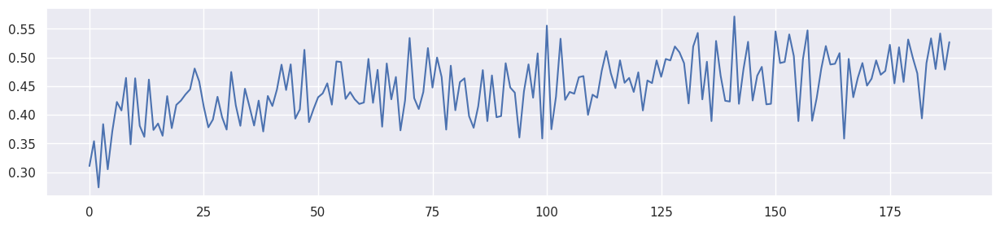

Mean F1 for all data: 0.4473343509454414


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


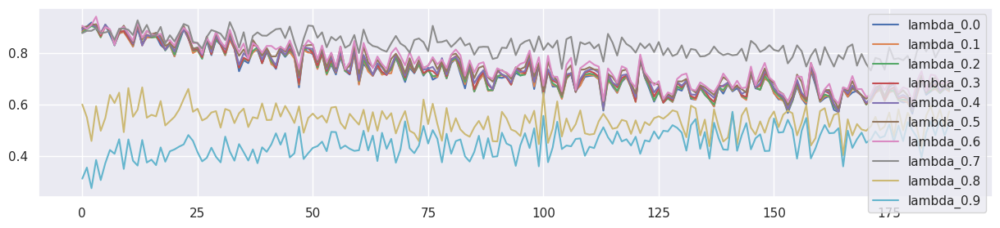

In [33]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model22(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


## MINE를 통해 I(y^,z) 측정

(40000, 5)
(40000,)


100%|██████████| 300/300 [00:00<00:00, 549.70it/s]

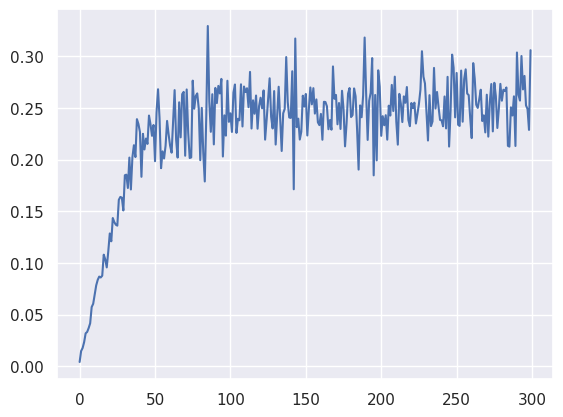

In [34]:
from tqdm import tqdm

H=20
n_epoch = 300
minibatch = 1000

x1 = X[0:1800][['z0']].values
y1 = y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss)

In [35]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model3(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        ret = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = torch.abs(ret)  # maximize

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(mi_loss)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss   + lambda_f * (mi_loss * 1000) 
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474273]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437781]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402506]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369965]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341810]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317959]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 563.22it/s]


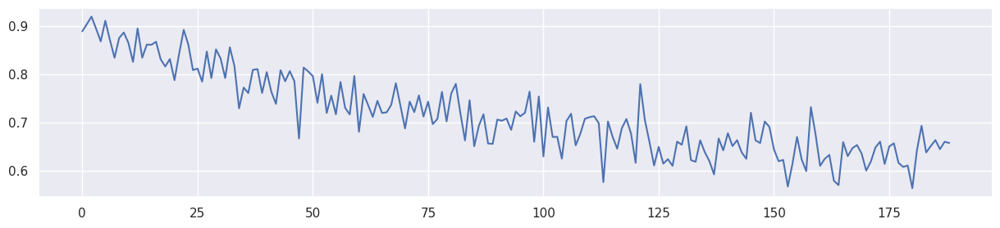

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 0.001382] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 0.000010] [G loss: 0.690334]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 0.000005] [G loss: 0.679383]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 0.000002] [G loss: 0.657220]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 0.000165] [G loss: 0.632453]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 0.000012] [G loss: 0.604140]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 0.000028] [G loss: 0.571912]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 0.000010] [G loss: 0.537440]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 0.000009] [G loss: 0.502171]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 0.000027] [G loss: 0.466058]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 0.000015] [G loss: 0.430721]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 0.000007] [G loss: 0.396640]
[Lambda: 0.100000] [Epoch 2400/4000] [mi loss: 0.00001

100%|██████████| 189/189 [00:00<00:00, 571.95it/s]


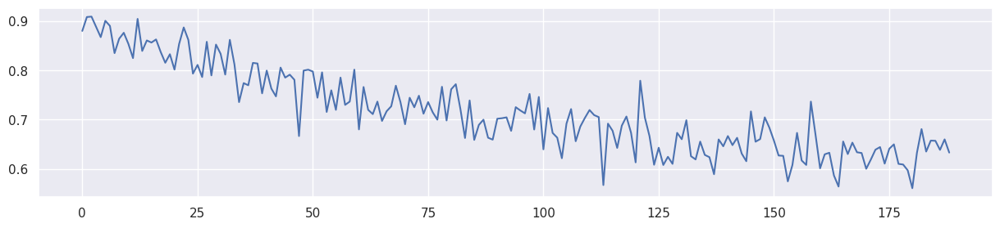

Mean F1 for all data: 0.7158778973332484
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 0.001319] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 0.000010] [G loss: 0.693658]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 0.000021] [G loss: 0.689249]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 0.000008] [G loss: 0.681604]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 0.000069] [G loss: 0.668535]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 0.000002] [G loss: 0.653010]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 0.000017] [G loss: 0.634499]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 0.000004] [G loss: 0.610496]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.581540]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 0.000046] [G loss: 0.549531]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 0.000004] [G loss: 0.517180]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 0.000042] [G loss: 0.483683]
[Lambda: 0.200000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 588.04it/s]


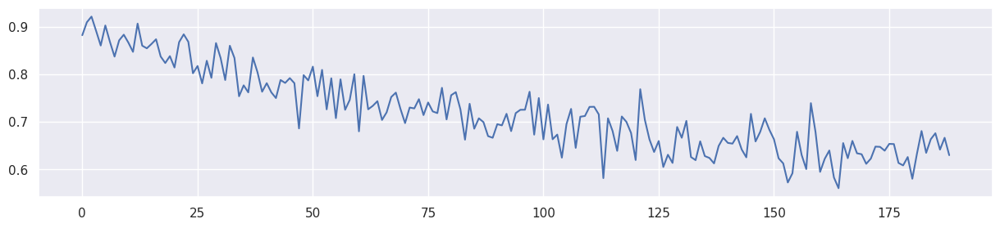

Mean F1 for all data: 0.7203258748044296
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 0.001269] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 0.000017] [G loss: 0.694429]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 0.000016] [G loss: 0.693279]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 0.000003] [G loss: 0.689851]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 0.000033] [G loss: 0.687518]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 0.000002] [G loss: 0.682865]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 0.000011] [G loss: 0.674149]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 0.000014] [G loss: 0.663494]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 0.000029] [G loss: 0.649282]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 0.000002] [G loss: 0.632431]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 0.000002] [G loss: 0.612124]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 0.000006] [G loss: 0.587677]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss: 0.00001

100%|██████████| 189/189 [00:00<00:00, 542.91it/s]


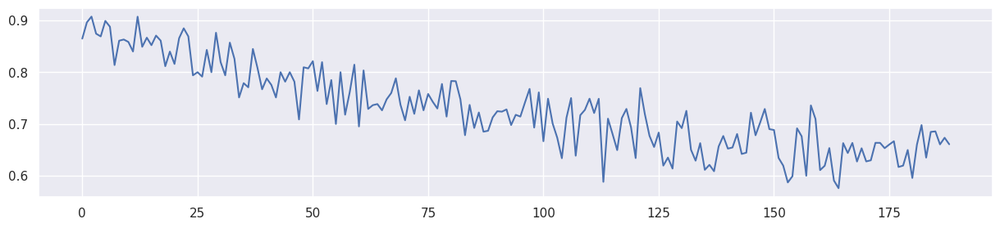

Mean F1 for all data: 0.7289288333993694
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 0.001424] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 0.000215] [G loss: 0.694740]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 0.000029] [G loss: 0.694059]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 0.000018] [G loss: 0.692535]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 0.000019] [G loss: 0.689674]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 0.000005] [G loss: 0.688165]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 0.000004] [G loss: 0.683741]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 0.000036] [G loss: 0.677924]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 0.000007] [G loss: 0.671604]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 0.000001] [G loss: 0.662657]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 0.000003] [G loss: 0.651120]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 0.000012] [G loss: 0.638011]
[Lambda: 0.400000] [Epoch 2400/4000] [mi loss: 0.00002

100%|██████████| 189/189 [00:00<00:00, 576.01it/s]


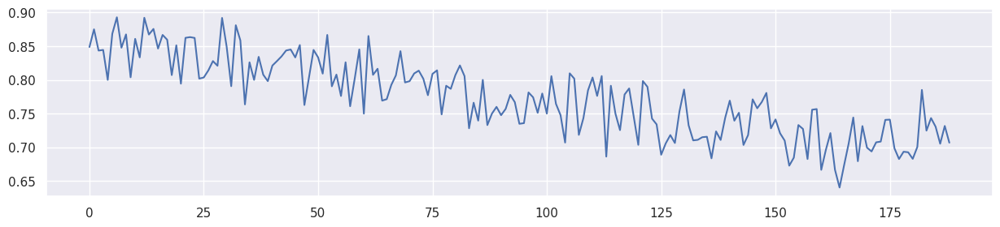

Mean F1 for all data: 0.7740763177739197
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 0.001455] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 0.000073] [G loss: 0.695005]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 0.000008] [G loss: 0.694270]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 0.000015] [G loss: 0.693995]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 0.000005] [G loss: 0.692222]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 0.000014] [G loss: 0.689420]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 0.000002] [G loss: 0.685742]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 0.000005] [G loss: 0.679810]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 0.000002] [G loss: 0.672650]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 0.000012] [G loss: 0.663090]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 0.000010] [G loss: 0.650979]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 0.000067] [G loss: 0.636673]
[Lambda: 0.500000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 579.77it/s]


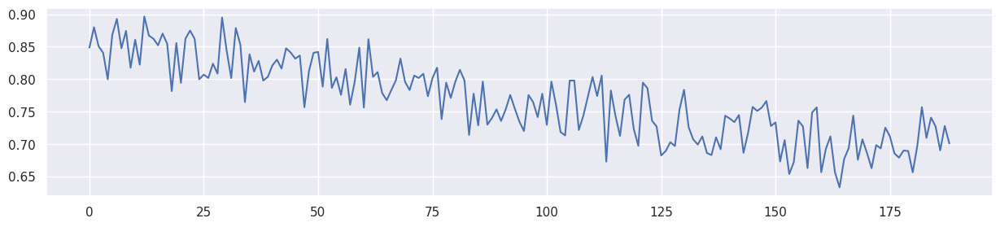

Mean F1 for all data: 0.7680861867381144
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 0.000005] [G loss: 0.695211]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 0.000020] [G loss: 0.694588]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 0.000128] [G loss: 0.694237]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 0.000006] [G loss: 0.693217]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 0.000003] [G loss: 0.691246]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 0.000003] [G loss: 0.689391]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 0.000013] [G loss: 0.687028]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.683353]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 0.000000] [G loss: 0.679777]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 0.000006] [G loss: 0.676561]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 0.000002] [G loss: 0.672366]
[Lambda: 0.600000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 536.48it/s]


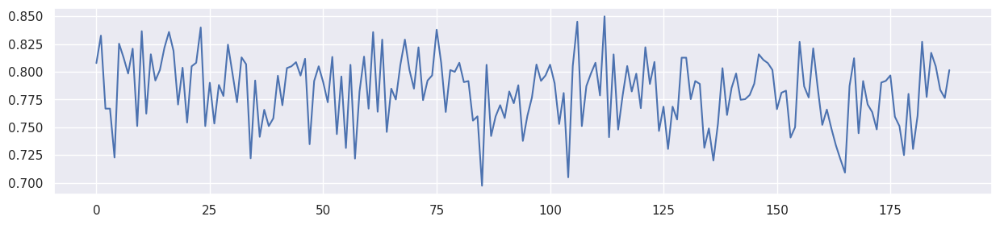

Mean F1 for all data: 0.7825877661235514
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 0.001458] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.000010] [G loss: 0.695013]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 0.000020] [G loss: 0.694769]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 0.000003] [G loss: 0.694367]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 0.000009] [G loss: 0.693828]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 0.000015] [G loss: 0.693079]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 0.000000] [G loss: 0.691196]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 0.000003] [G loss: 0.689362]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 0.000004] [G loss: 0.686561]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 0.000004] [G loss: 0.681772]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 0.000011] [G loss: 0.676662]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 0.000003] [G loss: 0.672204]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 0.00004

100%|██████████| 189/189 [00:00<00:00, 533.38it/s]


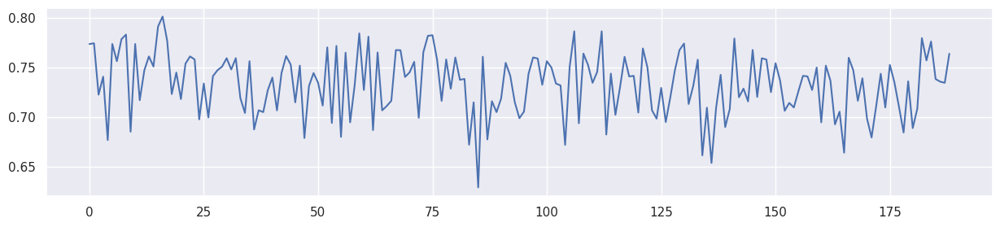

Mean F1 for all data: 0.7332724195581002
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.000043] [G loss: 0.695260]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 0.000002] [G loss: 0.695046]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 0.000006] [G loss: 0.694836]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 0.000004] [G loss: 0.694473]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 0.000026] [G loss: 0.694224]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 0.000052] [G loss: 0.693528]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 0.000004] [G loss: 0.693063]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 0.000009] [G loss: 0.692699]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 0.000013] [G loss: 0.691341]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 0.000001] [G loss: 0.690499]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 0.000001] [G loss: 0.689991]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 578.73it/s]


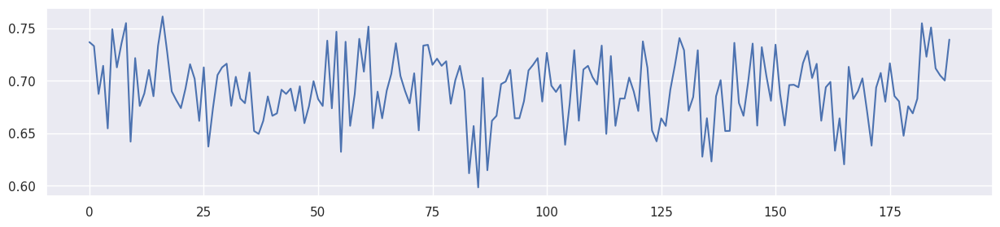

Mean F1 for all data: 0.6919349297045316
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 0.001462] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.000037] [G loss: 0.695146]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 0.000002] [G loss: 0.694899]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 0.000029] [G loss: 0.694744]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 0.000027] [G loss: 0.694685]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 0.000021] [G loss: 0.694648]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 0.000044] [G loss: 0.694386]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 0.000015] [G loss: 0.694158]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 0.000011] [G loss: 0.693777]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 0.000010] [G loss: 0.693623]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 0.000002] [G loss: 0.693404]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 0.000001] [G loss: 0.693208]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 577.19it/s]


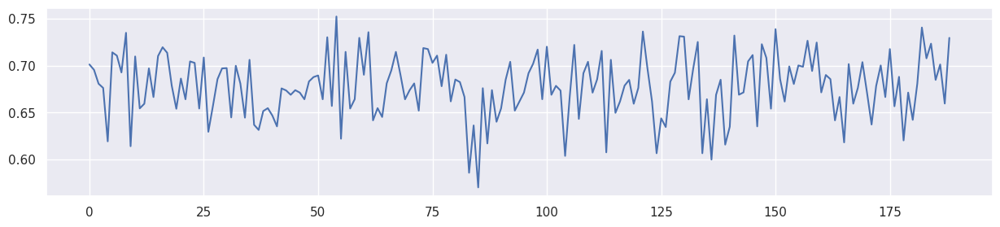

Mean F1 for all data: 0.6779981814202746


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


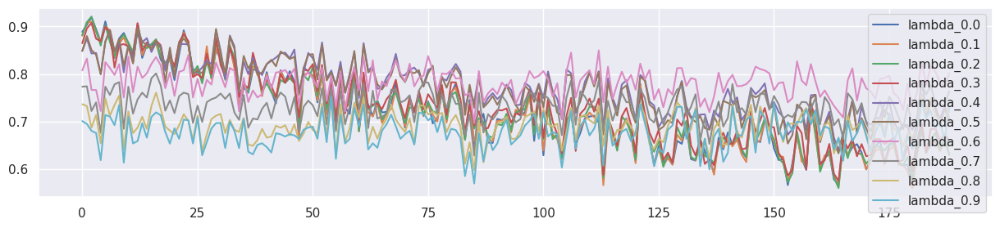

In [36]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model3(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



In [37]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model4(train_tensors, test_tensors, train_opt, lambda_f, seed,alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()  # y^의 샘플
        #y2 = y_train[s].data.numpy().reshape(-1,1) # y의 샘플
        #print('y1',y1.shape)
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        y2_sample = y_train[s].reshape(-1,1) #Variable(torch.from_numpy(y2).type(torch.FloatTensor), requires_grad = True)
        y2_shuffle = y_train[np.random.permutation(s)].reshape(-1,1) #Variable(torch.from_numpy(np.random.permutation(y2)).type(torch.FloatTensor), requires_grad = True)    

        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        ret2 = torch.mean(mine(x_sample, y2_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y2_shuffle))))

        # ret2(y의 샘플)는 maximize 하야 하고
        # ret1(y^의 샘플)는 0으로 minimize 해야 한다.!!! 
        mi_loss = - ret2 + torch.abs(ret1)

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(-ret2)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss  + lambda_f * mi_loss * alpha
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474273]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437781]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402506]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369965]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341810]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317959]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 578.09it/s]


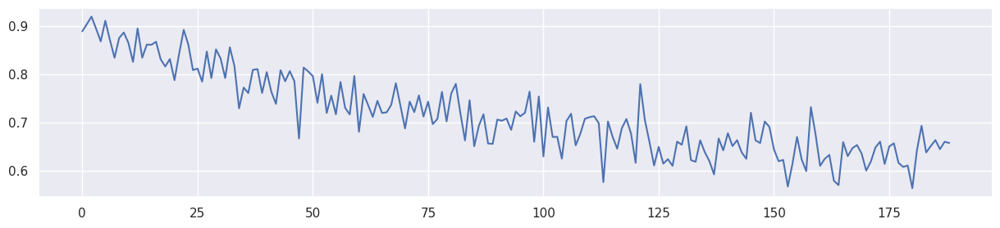

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: -0.000739] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: -0.222204] [G loss: 0.678285]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: -0.238811] [G loss: 0.650699]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: -0.240417] [G loss: 0.619741]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: -0.264929] [G loss: 0.586266]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: -0.244452] [G loss: 0.551068]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: -0.287771] [G loss: 0.515156]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: -0.231075] [G loss: 0.478964]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: -0.227044] [G loss: 0.443394]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: -0.294317] [G loss: 0.408887]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: -0.259852] [G loss: 0.376677]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: -0.256305] [G loss: 0.348601]
[Lambda: 0.100000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 591.82it/s]


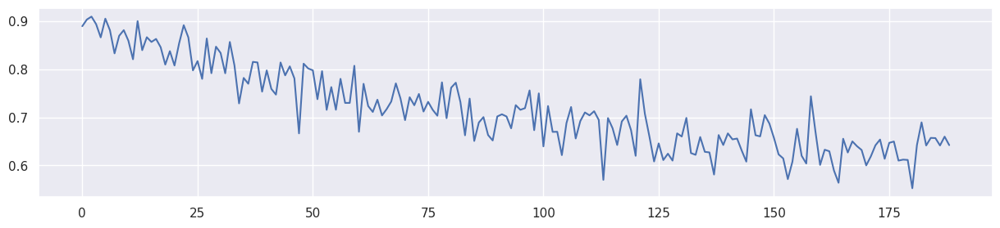

Mean F1 for all data: 0.7166172688706061
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: -0.000677] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: -0.244677] [G loss: 0.679501]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: -0.282805] [G loss: 0.654145]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: -0.241375] [G loss: 0.624884]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: -0.248786] [G loss: 0.592981]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: -0.284136] [G loss: 0.559478]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: -0.232819] [G loss: 0.525525]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: -0.213839] [G loss: 0.491554]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: -0.218476] [G loss: 0.457743]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: -0.270564] [G loss: 0.425254]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: -0.284400] [G loss: 0.394681]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: -0.252321] [G loss: 0.367165]
[Lambda: 0.200000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 580.64it/s]


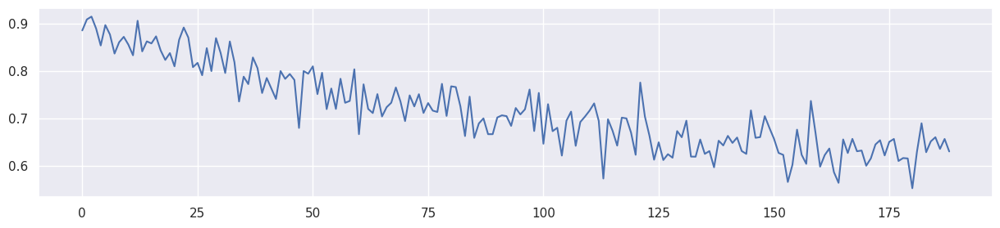

Mean F1 for all data: 0.7174690302009036
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: -0.000742] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: -0.248091] [G loss: 0.681491]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: -0.269549] [G loss: 0.659951]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: -0.175454] [G loss: 0.632493]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: -0.278666] [G loss: 0.602481]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: -0.255791] [G loss: 0.571119]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: -0.270997] [G loss: 0.539707]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: -0.296688] [G loss: 0.508968]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: -0.265802] [G loss: 0.479028]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: -0.211619] [G loss: 0.450317]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: -0.186815] [G loss: 0.422123]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: -0.224808] [G loss: 0.395891]
[Lambda: 0.300000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 582.87it/s]


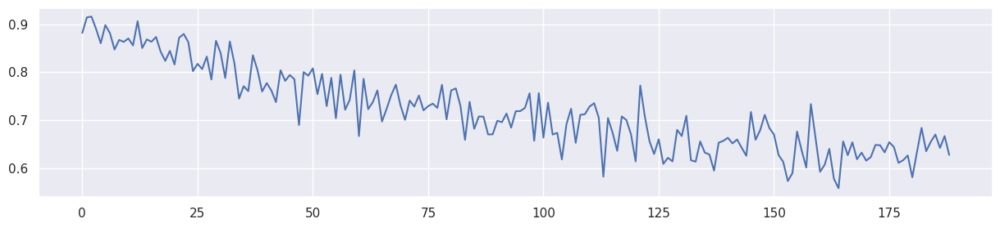

Mean F1 for all data: 0.7196030360170174
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: -0.000893] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: -0.274784] [G loss: 0.682686]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: -0.277081] [G loss: 0.668278]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: -0.213880] [G loss: 0.645728]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: -0.207111] [G loss: 0.620046]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: -0.242759] [G loss: 0.593142]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: -0.237378] [G loss: 0.565520]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: -0.266545] [G loss: 0.538024]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: -0.284597] [G loss: 0.511460]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: -0.206707] [G loss: 0.485975]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: -0.236530] [G loss: 0.461289]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: -0.244584] [G loss: 0.437275]
[Lambda: 0.400000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 583.34it/s]


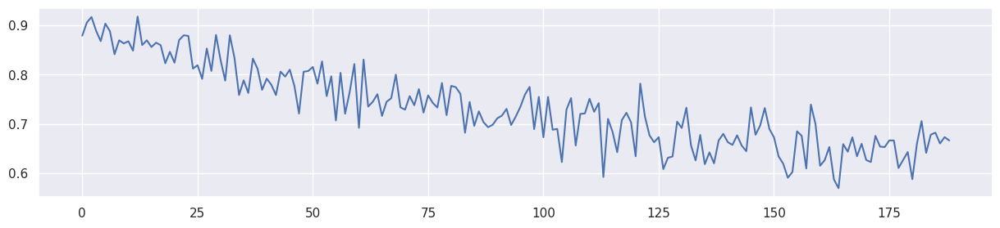

Mean F1 for all data: 0.7327053151379584
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: -0.000846] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: -0.274440] [G loss: 0.683831]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: -0.263487] [G loss: 0.674695]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: -0.271410] [G loss: 0.662373]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: -0.228253] [G loss: 0.643162]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: -0.271218] [G loss: 0.620710]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: -0.254863] [G loss: 0.597432]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: -0.280986] [G loss: 0.573249]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: -0.269352] [G loss: 0.549477]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: -0.194787] [G loss: 0.526691]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: -0.258177] [G loss: 0.504597]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: -0.247101] [G loss: 0.485078]
[Lambda: 0.500000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 582.59it/s]


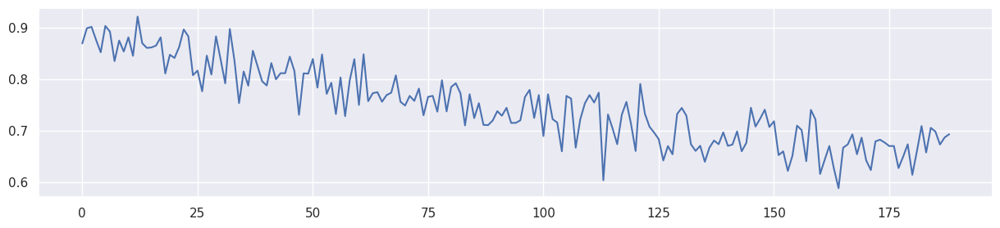

Mean F1 for all data: 0.748698044512991
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: -0.000558] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: -0.236392] [G loss: 0.684281]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: -0.261557] [G loss: 0.678292]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: -0.268044] [G loss: 0.670915]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: -0.266929] [G loss: 0.661975]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: -0.259819] [G loss: 0.650994]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: -0.228232] [G loss: 0.637667]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: -0.300358] [G loss: 0.622264]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: -0.279971] [G loss: 0.604267]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: -0.242470] [G loss: 0.584731]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: -0.306077] [G loss: 0.565758]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: -0.275019] [G loss: 0.547496]
[Lambda: 0.600000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 576.51it/s]


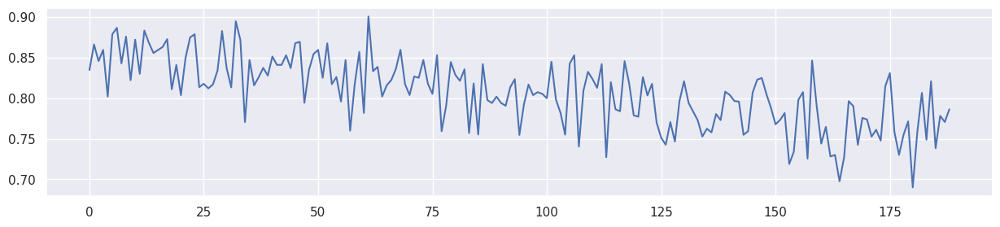

Mean F1 for all data: 0.8071752353265313
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: -0.000891] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: -0.269727] [G loss: 0.685879]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: -0.256411] [G loss: 0.682895]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: -0.293208] [G loss: 0.679686]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: -0.263828] [G loss: 0.675887]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: -0.221186] [G loss: 0.670902]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: -0.280141] [G loss: 0.664660]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: -0.231352] [G loss: 0.656291]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: -0.221435] [G loss: 0.646488]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: -0.223403] [G loss: 0.635751]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: -0.305565] [G loss: 0.624539]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: -0.248135] [G loss: 0.612382]
[Lambda: 0.700000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 551.09it/s]


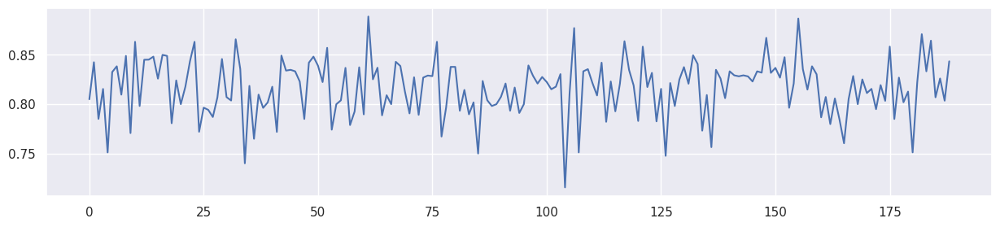

Mean F1 for all data: 0.8163603100880936
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: -0.000439] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: -0.286964] [G loss: 0.686221]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: -0.252939] [G loss: 0.684601]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: -0.257779] [G loss: 0.683090]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: -0.239104] [G loss: 0.681463]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: -0.243798] [G loss: 0.679242]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: -0.221941] [G loss: 0.677782]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: -0.253339] [G loss: 0.675822]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: -0.223547] [G loss: 0.673817]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: -0.285081] [G loss: 0.671533]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: -0.309513] [G loss: 0.668124]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: -0.268052] [G loss: 0.664647]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 593.50it/s]


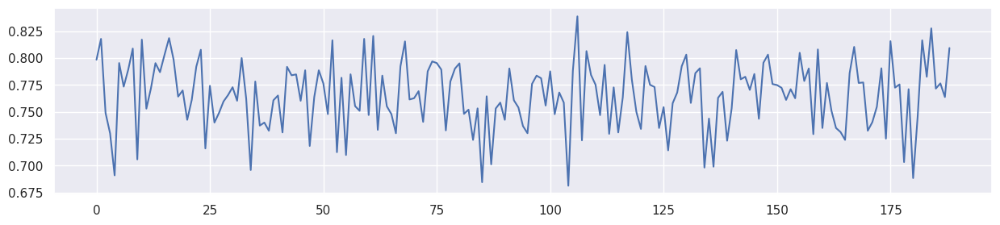

Mean F1 for all data: 0.7655781832131313
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: -0.000790] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: -0.240979] [G loss: 0.687310]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: -0.261700] [G loss: 0.686773]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: -0.274194] [G loss: 0.686737]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: -0.222383] [G loss: 0.686412]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: -0.275843] [G loss: 0.686157]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: -0.224144] [G loss: 0.685774]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: -0.261649] [G loss: 0.685363]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: -0.263810] [G loss: 0.685633]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: -0.242641] [G loss: 0.685304]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: -0.241087] [G loss: 0.685452]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: -0.205416] [G loss: 0.685417]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 574.95it/s]


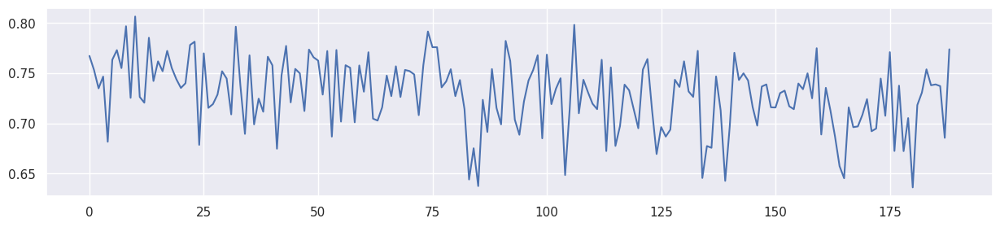

Mean F1 for all data: 0.7293198570413684


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


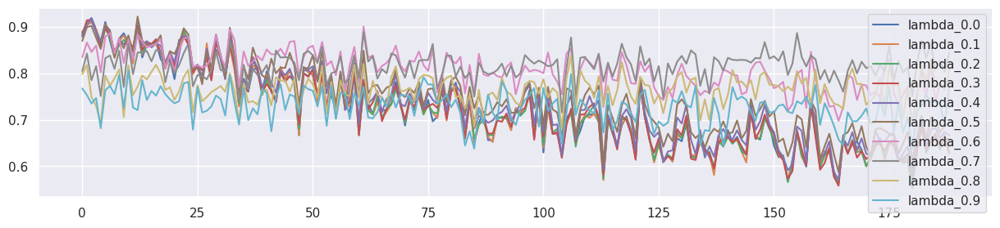

In [38]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model4(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed,alpha=1.2)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



# GAN 기반의 RF-Train이 아닌, G(Z,B) 모델에서 전처리 학습 방법 적용
+ GAN 기번의 RF-Train 응용 방법은 일종의 orver-fitting을 막는 방법론에 해당한다.
+ 즉, trainset의 z에 over-fitting되어 이후 live data에 대해 성능이 저하되는 현상을 막도록하는 방법이다.
+ 따라서 이 방법은 결정적으로 test_f1 및 init_f1을 낮게 (z를 포함한 모든 feature을 학습하는 일반적인 학습방법에 비하여) 하는 결점을 갖는다.
+ 그렇다면, 이를 극복하며 live data의 성능도 떨어지지 않게 하는 방법은 무엇인가?
+ 본 chapter에서는 G(Z,B)를 입력으로 갖는 구조. 즉, bucket number와 z의 관계를 학습하여 전처리의 개념으로 새로 생성된 g를 z에 대신하여 D(x,g)에 입력하여 학습하는 모델을 제안한다.

## D(x,G(z,b)) 구조


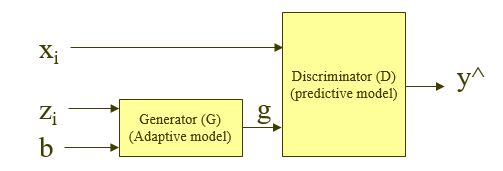

<pre>
x0 -------------------------------------> |                        |
x1 -------------------------------------> |                        |
x2 -------------------------------------> | Discriminator (D(x,g)) | -> y^
x3 -------------------------------------> | predictive model       |
z0 ------>| Generator (G(z,b)) | -- g --> |                        |
b  ------>| adaptive model     |
</pre>

+ 상기 구조의 loss function

$$
L_1 = H(y,\hat{y}) = H(y,D(x,G(z,b)))=\mathbb{E}_{y}[-log(D(x,G(z,b)))]
$$

$$
L_2 = MSE(G(z,b),z)
$$

$$
\min_{G(.)} (1-λ) L_1 + λ L_2
$$


+ 위의 loss function에서, lambda가 0이면 $L_1$의 backward 에서 D를 거쳐 G까지 학습이 이루어 진다. 
+ lambda가 0~1 사이의 값인 경우, G의 생성이 b의 값을 무시하는 방향으로 학습된다. 즉, feature 5개 입력의 특성에 근접, 다시말해 over-fitting의 효과로 학습된다.

In [39]:
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


In [40]:
mi_scores = make_mi_scores(X[['x0','x1','x2','x3','z0']], X['b'], discrete_features="auto")
print(mi_scores)

z0    0.163087
x0    0.000000
x1    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64


+ I(Z,B) 만 0.16의 수치가 나오는 것을 확인 할 수 있음!!!!
+ 즉, Z는 시간에 따라 importance가 변하고 있음.... -> Concept drift의 발생 요소  

In [41]:
# 학습셋에서의 I(Z,B)

mi_scores = make_mi_scores(X[0:2000][['x0','x1','x2','x3','z0']], X[0:2000]['b'], discrete_features="auto")
print(mi_scores)

x3    0.020639
x2    0.010275
x0    0.000000
x1    0.000000
z0    0.000000
Name: MI Scores, dtype: float64


+ 감지 안됨!!!!

(40000, 5)
(40000,)


100%|██████████| 5000/5000 [00:08<00:00, 568.82it/s]



0.0058872644


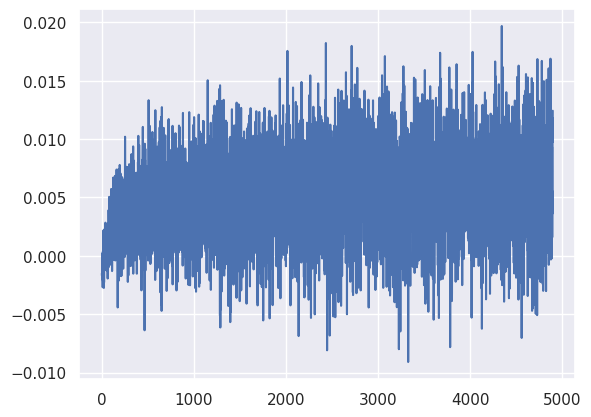

In [42]:
from tqdm import tqdm

H=20
n_epoch = 5000
minibatch = 1000

x1 = X[0:2000][['z0']].values
y1 = X[0:2000][['b']].values #y_train.data.numpy()

#x1 = X[['z0']].values
#y1 = X[['b']].values #y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss[100:])
print(np.mean(plot_loss[4000:]))

+ 유의미하게 감지되지 않음.....
+ 잘 안될거 같은데...

In [43]:
avaible_range = 400

In [44]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 15),
            nn.ReLU(),
            nn.Linear(15, 5),
            nn.ReLU(),
            nn.Linear(5, 1)          
        )

    def forward(self, z0,b):

        adjusted_z = self.model(torch.cat((z0,b), 1))
        return adjusted_z

In [45]:

def test_model2(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    a_z = model2_(tX[:,4].reshape(-1,1),tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(torch.cat((tX[:,0:4],a_z.reshape(-1,1)),1))
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [46]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model5(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        '''
        s = np.random.choice(XS_train.shape[0],minibatch)

        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = XS_train[s][:,5].reshape(-1,1) # bucket number.. B
        y_shuffle = XS_train[np.random.permutation(s)][:,5].reshape(-1,1) #permute bucket number.. B
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        ibz = torch.full((XS_train.shape[0],1), ret1.data.numpy())
        '''
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [47]:
def test_all_data3(generator,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            #xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)).reshape(-1,1)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

In [48]:
def test_all_data2(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 154.037689] [G loss: 0.662213]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 281.415771] [G loss: 0.569898]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 321.137939] [G loss: 0.513112]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 383.931793] [G loss: 0.471092]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 435.589111] [G loss: 0.435976]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 441.561279] [G loss: 0.405468]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 413.537842] [G loss: 0.377526]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 353.051453] [G loss: 0.350677]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 286.746094] [G loss: 0.324127]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 203.390228] [G loss: 0.298379]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 159.028336] [G loss: 0.274451]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 131.341766] [G loss: 0.2

100%|██████████| 189/189 [00:00<00:00, 488.81it/s]


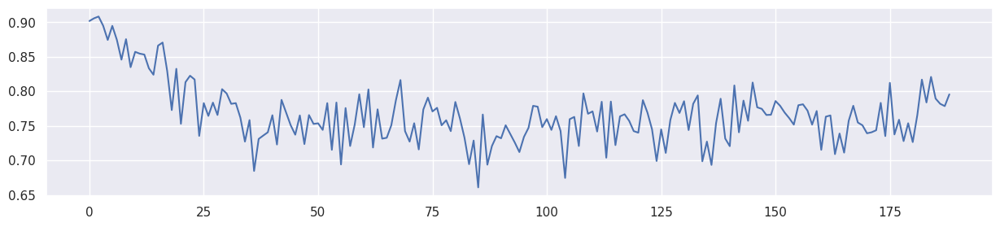

Mean F1 for all data: 0.7671384668320734
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 126.916344] [G loss: 0.659000]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 259.658936] [G loss: 0.565477]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 295.239990] [G loss: 0.510204]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 318.317963] [G loss: 0.469357]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 321.303192] [G loss: 0.432951]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 286.339539] [G loss: 0.398818]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 242.240585] [G loss: 0.367243]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 192.373734] [G loss: 0.335924]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 151.028549] [G loss: 0.305532]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 125.048851] [G loss: 0.279724]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 104.483070] [G loss: 0.261096]
[Lambda: 0.100000] [Epoch 2400

100%|██████████| 189/189 [00:00<00:00, 501.76it/s]


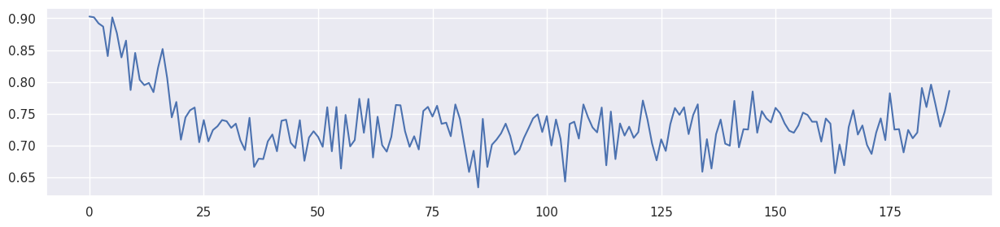

Mean F1 for all data: 0.7358251170708022
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 108.305573] [G loss: 0.662244]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 233.022034] [G loss: 0.568126]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 255.834732] [G loss: 0.513087]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 270.882019] [G loss: 0.472069]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 258.211548] [G loss: 0.436349]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 229.190125] [G loss: 0.403098]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 194.159256] [G loss: 0.370382]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 164.164795] [G loss: 0.339156]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 136.805801] [G loss: 0.311588]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 104.598816] [G loss: 0.282988]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 95.176773] [G loss: 0.263347]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 496.88it/s]


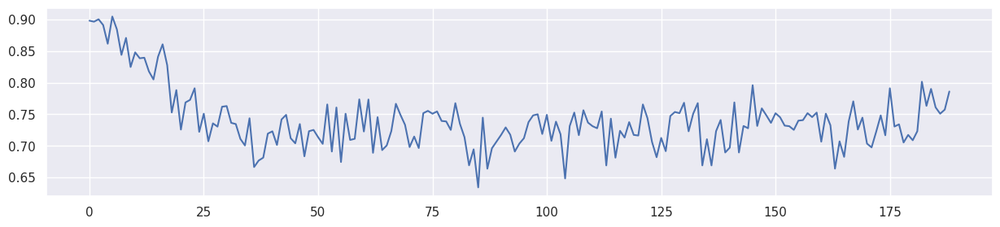

Mean F1 for all data: 0.7407233046624094
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 108.108543] [G loss: 0.662619]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 244.500977] [G loss: 0.563338]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 250.700500] [G loss: 0.512984]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 246.803543] [G loss: 0.473826]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 224.084534] [G loss: 0.437348]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 198.150574] [G loss: 0.402091]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 165.966400] [G loss: 0.368311]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 140.066956] [G loss: 0.336334]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 119.050529] [G loss: 0.308645]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 94.085396] [G loss: 0.280496]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 85.905914] [G loss: 0.261447]
[Lambda: 0.300000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 488.53it/s]


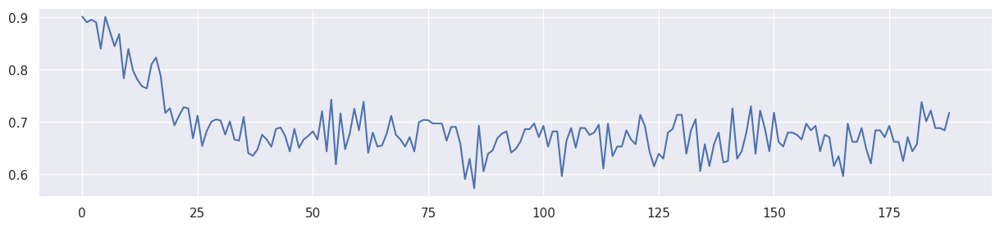

Mean F1 for all data: 0.6881196512366309
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 105.021851] [G loss: 0.663811]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 223.375244] [G loss: 0.566038]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 227.881287] [G loss: 0.514031]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 214.201477] [G loss: 0.475264]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 192.889389] [G loss: 0.437900]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 167.879837] [G loss: 0.401349]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 141.305511] [G loss: 0.365616]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 123.729172] [G loss: 0.332350]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 100.928383] [G loss: 0.301501]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 88.036629] [G loss: 0.275650]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 79.434853] [G loss: 0.256010]
[Lambda: 0.400000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 499.15it/s]


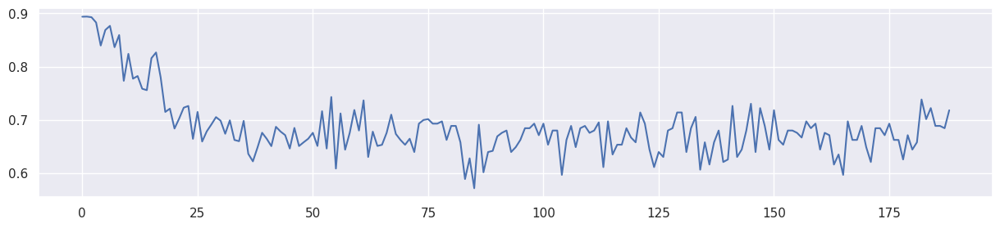

Mean F1 for all data: 0.6857688506775905
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 99.148613] [G loss: 0.665537]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 202.728561] [G loss: 0.570021]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 205.899475] [G loss: 0.515912]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 189.134796] [G loss: 0.476811]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.316055] [G loss: 0.439014]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 144.503723] [G loss: 0.400651]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 126.147789] [G loss: 0.363825]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 104.077393] [G loss: 0.330485]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 88.905807] [G loss: 0.297338]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 81.817215] [G loss: 0.271038]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 77.142807] [G loss: 0.253292]
[Lambda: 0.500000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 467.26it/s]


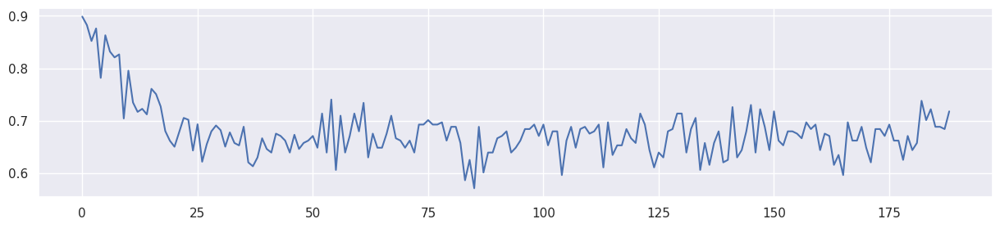

Mean F1 for all data: 0.6789155328238936
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 101.285835] [G loss: 0.664391]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 178.838837] [G loss: 0.573957]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 186.534378] [G loss: 0.518391]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 167.070175] [G loss: 0.478997]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 146.401123] [G loss: 0.440261]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 128.446671] [G loss: 0.400894]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 109.865845] [G loss: 0.363695]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 93.544411] [G loss: 0.327122]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.629829] [G loss: 0.293951]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 78.558655] [G loss: 0.269702]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 75.241302] [G loss: 0.252522]
[Lambda: 0.600000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 482.63it/s]


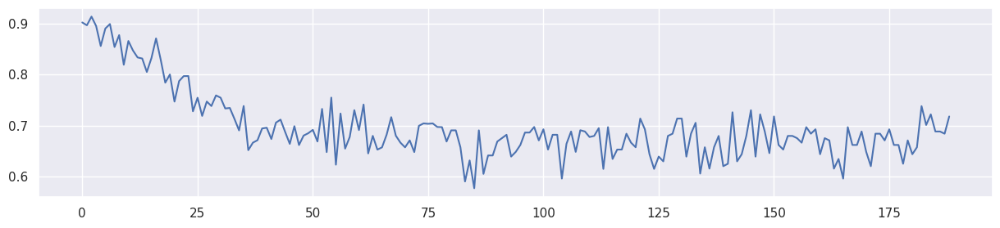

Mean F1 for all data: 0.6976273334426256
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 97.957535] [G loss: 0.665843]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 157.467285] [G loss: 0.581395]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 162.816254] [G loss: 0.523593]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.372314] [G loss: 0.481787]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 126.938087] [G loss: 0.439190]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 110.533211] [G loss: 0.395884]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 96.926727] [G loss: 0.352476]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 87.331352] [G loss: 0.312696]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 81.403625] [G loss: 0.280193]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 77.304314] [G loss: 0.257476]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 75.030289] [G loss: 0.242386]
[Lambda: 0.700000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 508.15it/s]


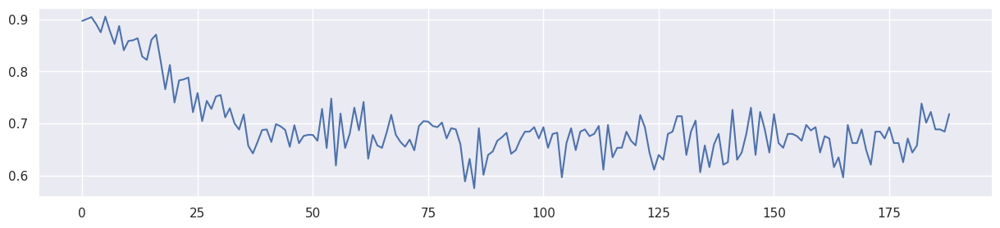

Mean F1 for all data: 0.69635132398417
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 94.237000] [G loss: 0.668296]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 123.860085] [G loss: 0.603457]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 135.120285] [G loss: 0.533999]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 123.296112] [G loss: 0.481969]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 110.047150] [G loss: 0.431921]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 75.274490] [G loss: 0.352046]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 62.311920] [G loss: 0.312983]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 52.378555] [G loss: 0.277931]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 45.684410] [G loss: 0.255306]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 40.511665] [G loss: 0.241819]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 37.429756] [G loss: 0.233076]
[Lambda: 0.800000] [Epoch 2400/4000] [m

100%|██████████| 189/189 [00:00<00:00, 493.84it/s]


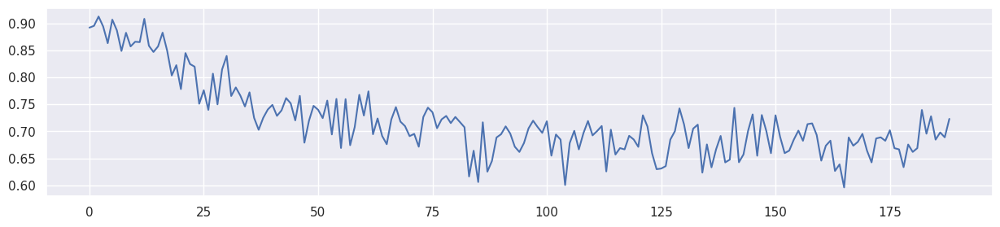

Mean F1 for all data: 0.719629626349835
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 93.008713] [G loss: 0.669598]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 91.841370] [G loss: 0.640878]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 99.362419] [G loss: 0.580103]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 102.189415] [G loss: 0.499802]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 96.068115] [G loss: 0.435180]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 89.400383] [G loss: 0.377915]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 83.727089] [G loss: 0.328949]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 79.521378] [G loss: 0.291516]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 76.074707] [G loss: 0.265992]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 73.612694] [G loss: 0.249605]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 71.348045] [G loss: 0.240141]
[Lambda: 0.900000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 488.03it/s]


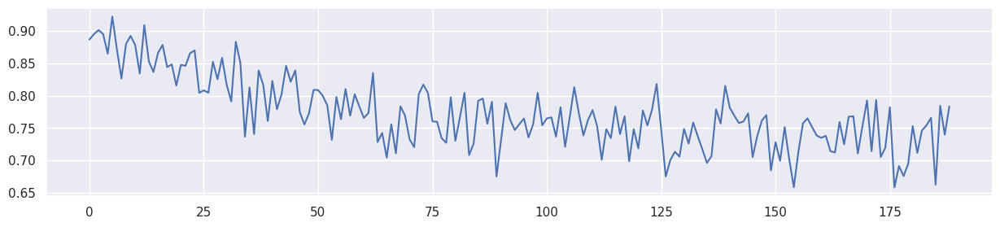

Mean F1 for all data: 0.7728754180942774


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


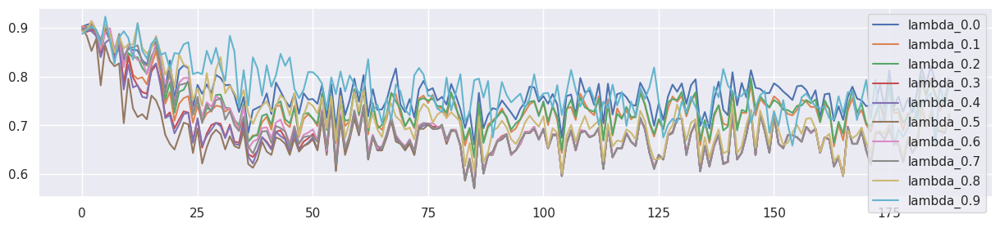

In [49]:
seed_everything()

train_result = []

avaible_range = 1

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ bucket number를 normalize하면 모델의 유효기간을 설정할 수 있다.
+ 즉, 유효기간까지는 model의 성능을 보전 시킬 수 있는 개념
+ 상기 모든 처리를 그대로 두고 bucket number를 normalize 하여 실험 한다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 108.244400] [G loss: 0.663271]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 231.880386] [G loss: 0.572146]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 270.650635] [G loss: 0.512678]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 316.379883] [G loss: 0.471908]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 347.266449] [G loss: 0.436837]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 345.950165] [G loss: 0.405479]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 316.007111] [G loss: 0.375412]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 283.123444] [G loss: 0.345048]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 217.554138] [G loss: 0.316754]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 198.166306] [G loss: 0.291417]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 178.515823] [G loss: 0.271767]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 166.529114] [G loss: 0.25

100%|██████████| 189/189 [00:00<00:00, 493.40it/s]


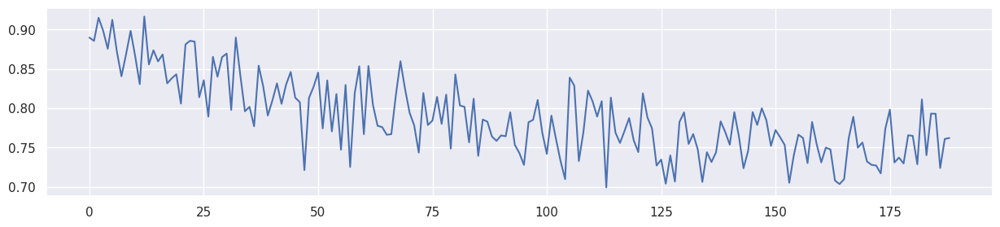

Mean F1 for all data: 0.7895073013447387
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 105.813400] [G loss: 0.663555]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 224.948853] [G loss: 0.571824]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 261.543884] [G loss: 0.512670]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 286.739136] [G loss: 0.472426]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 294.137085] [G loss: 0.435931]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 279.201019] [G loss: 0.377399]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 237.905640] [G loss: 0.346154]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 177.756378] [G loss: 0.316419]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 142.446091] [G loss: 0.290156]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 124.149651] [G loss: 0.271097]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 107.974495] [G loss: 0.257670]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 500.50it/s]


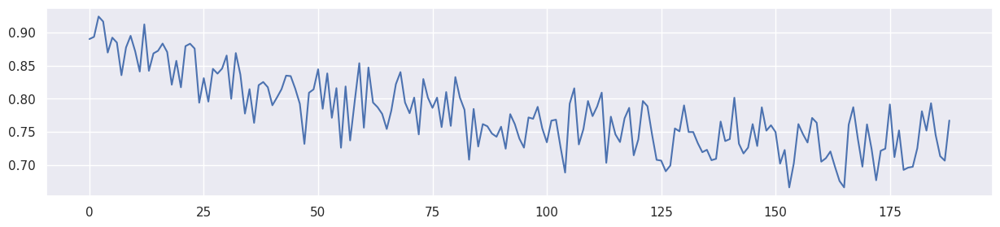

Mean F1 for all data: 0.7781396933465647
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 103.189285] [G loss: 0.664038]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 217.672775] [G loss: 0.572550]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 245.310974] [G loss: 0.513011]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 256.935577] [G loss: 0.473013]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 248.139038] [G loss: 0.436859]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 225.131332] [G loss: 0.402546]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 196.707916] [G loss: 0.369740]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 162.909363] [G loss: 0.338195]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 139.269531] [G loss: 0.308163]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 122.375763] [G loss: 0.284012]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 110.526833] [G loss: 0.265287]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 484.98it/s]


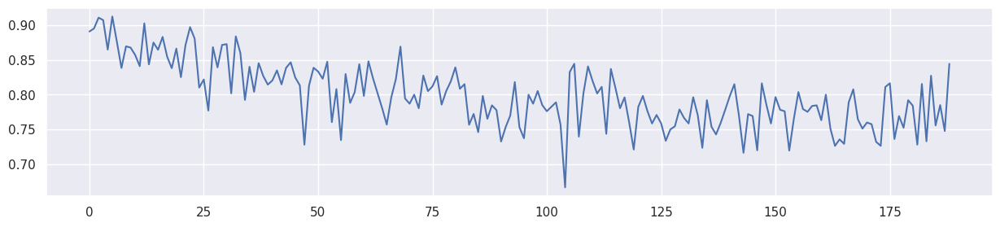

Mean F1 for all data: 0.799212610953688
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 101.657425] [G loss: 0.664655]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 208.767776] [G loss: 0.573653]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 232.385101] [G loss: 0.513578]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 232.131592] [G loss: 0.473925]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 215.201355] [G loss: 0.437610]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 195.984390] [G loss: 0.402036]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 169.412628] [G loss: 0.368718]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 140.884598] [G loss: 0.336175]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 121.961319] [G loss: 0.306671]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 110.134491] [G loss: 0.281841]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 102.141006] [G loss: 0.263815]
[Lambda: 0.300000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 486.08it/s]


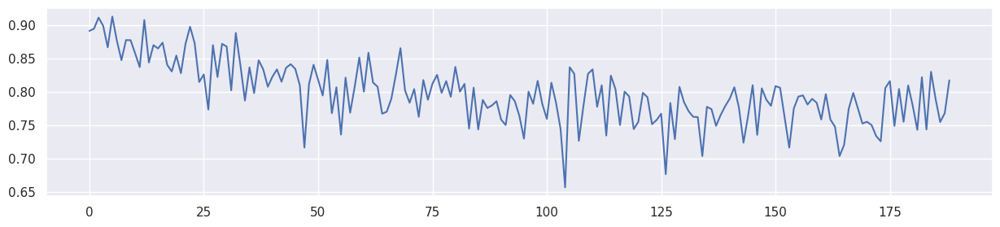

Mean F1 for all data: 0.7982071188228251
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 99.891266] [G loss: 0.665491]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 197.111877] [G loss: 0.575976]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 214.359375] [G loss: 0.514758]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 206.982254] [G loss: 0.475251]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 187.899185] [G loss: 0.438617]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 165.374725] [G loss: 0.402008]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 139.175613] [G loss: 0.367131]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 120.627625] [G loss: 0.333616]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 108.924347] [G loss: 0.303741]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 89.233284] [G loss: 0.278885]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 76.858353] [G loss: 0.257271]
[Lambda: 0.400000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 484.98it/s]


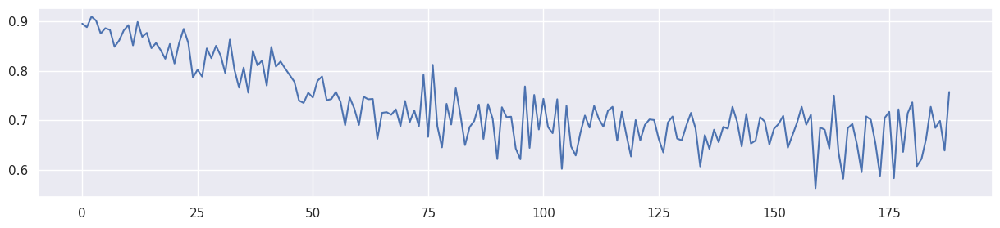

Mean F1 for all data: 0.7286886904084721
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 97.799957] [G loss: 0.666547]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 182.029449] [G loss: 0.579117]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 200.153122] [G loss: 0.516249]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 187.700867] [G loss: 0.477178]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.789307] [G loss: 0.439350]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 146.000839] [G loss: 0.401600]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 127.097206] [G loss: 0.365726]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 109.518044] [G loss: 0.332630]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 95.779427] [G loss: 0.300868]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 83.538925] [G loss: 0.274952]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 78.129013] [G loss: 0.256510]
[Lambda: 0.500000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 491.25it/s]


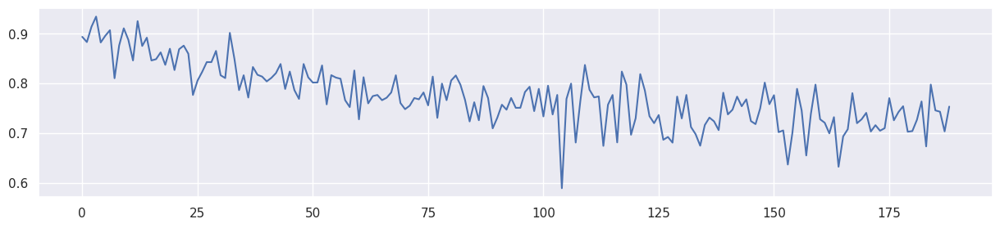

Mean F1 for all data: 0.7752058841305216
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 95.722603] [G loss: 0.667992]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 160.884705] [G loss: 0.591475]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 182.311707] [G loss: 0.520495]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 164.385361] [G loss: 0.480432]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 143.216782] [G loss: 0.441875]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 123.961342] [G loss: 0.401656]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 106.389160] [G loss: 0.361676]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 91.951126] [G loss: 0.323766]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.071861] [G loss: 0.289791]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 77.709702] [G loss: 0.265241]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 74.043365] [G loss: 0.247917]
[Lambda: 0.600000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 444.70it/s]


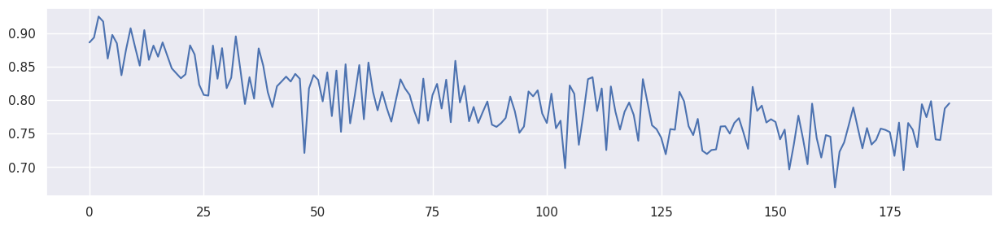

Mean F1 for all data: 0.7942930042271774
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.923409] [G loss: 0.669354]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 139.335175] [G loss: 0.605831]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 164.897507] [G loss: 0.528624]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.504639] [G loss: 0.484545]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.544777] [G loss: 0.441000]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.904396] [G loss: 0.396791]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.798691] [G loss: 0.352507]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.841049] [G loss: 0.311347]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.082924] [G loss: 0.278739]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.411499] [G loss: 0.255975]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.061630] [G loss: 0.242010]
[Lambda: 0.700000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 471.35it/s]


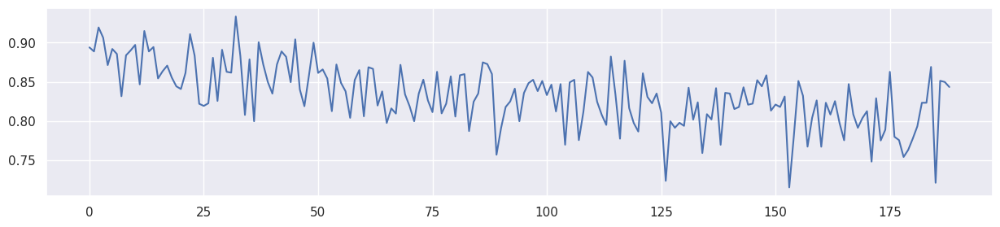

Mean F1 for all data: 0.8335893044260736
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 92.723732] [G loss: 0.670305]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 89.146736] [G loss: 0.646817]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 85.496346] [G loss: 0.616317]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 81.624825] [G loss: 0.576955]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 77.461494] [G loss: 0.526442]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 73.327538] [G loss: 0.469274]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 69.669044] [G loss: 0.416514]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 66.686401] [G loss: 0.376129]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 64.370445] [G loss: 0.350361]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 62.601749] [G loss: 0.336251]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 61.197292] [G loss: 0.329088]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 473.25it/s]


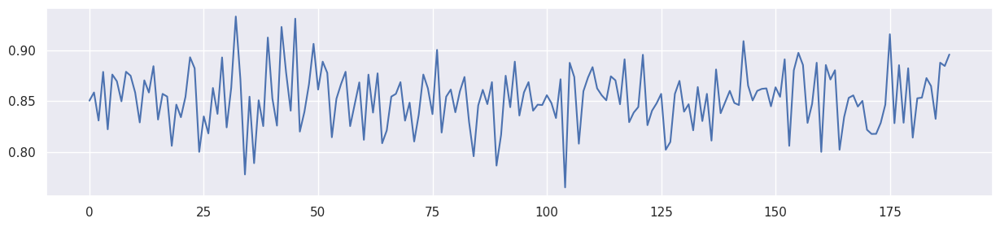

Mean F1 for all data: 0.8527776475629777
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 70.039795] [G loss: 0.675442]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 32.512573] [G loss: 0.643272]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 30.626368] [G loss: 0.611398]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.139790] [G loss: 0.541517]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 41.325260] [G loss: 0.347807]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 38.686207] [G loss: 0.289885]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 35.385715] [G loss: 0.264197]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 33.382076] [G loss: 0.249868]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 32.065613] [G loss: 0.241453]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 31.235592] [G loss: 0.235855]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 30.655460] [G loss: 0.232438]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 494.81it/s]


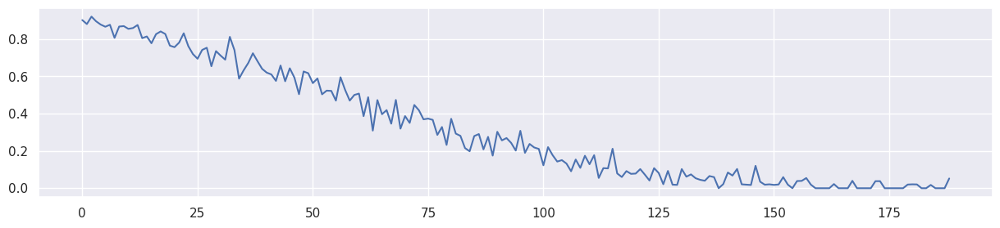

Mean F1 for all data: 0.317733419411196


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


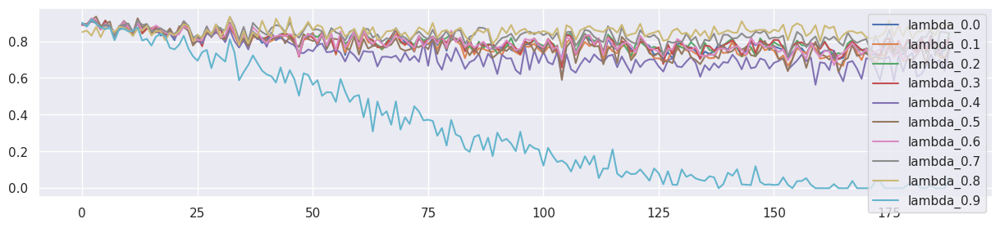

In [50]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ lambda 0.4 에서, I(z,b)와 I(g,b)를 비교하기

In [51]:
def test_all_data5(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    gs = torch.tensor([])
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            gs = torch.cat((gs,xs),0)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s,gs

[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.923409] [G loss: 0.669354]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 139.335175] [G loss: 0.605831]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 164.897507] [G loss: 0.528624]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.504639] [G loss: 0.484545]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.544777] [G loss: 0.441000]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.904396] [G loss: 0.396791]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.798691] [G loss: 0.352507]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.841049] [G loss: 0.311347]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.082924] [G loss: 0.278739]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.411499] [G loss: 0.255975]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.061630] [G loss: 0.242010]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 71.388351] [G loss: 0.234137]
[

100%|██████████| 190/190 [00:00<00:00, 503.53it/s]


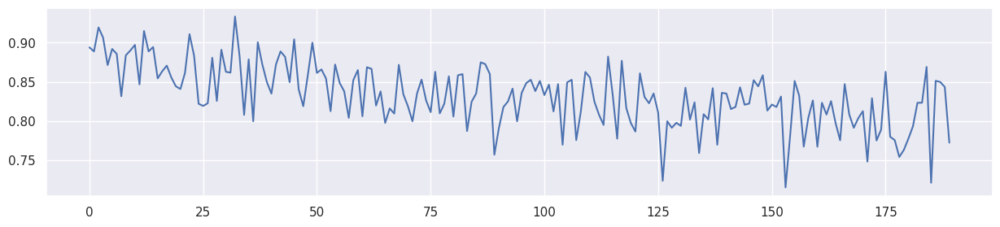

Mean F1 for all data: 0.8332689779434483
gs.shape torch.Size([38000, 1])
I(z,b) b     5.932748
z0    0.140249
x1    0.000640
x0    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64
I(g,b) 0.39605497515865284


In [52]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.7]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'],gs = test_all_data5(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

print('gs.shape',gs.shape)
mi_scores = make_mi_scores(X[2000:], X[2000:]['b'], discrete_features="auto")
print('I(z,b)',mi_scores)
mi_scores = make_mi_scores(pd.DataFrame(gs.data.numpy(),columns=['g']), X[2000:]['b'], discrete_features="auto")
print('I(g,b)',mi_scores['g'])



# D(x,G(z,b)) + MINE 구조

+ D(x,G(z,b)) 구조에서 보면, I(z,y), I(g,y) 를 최대로 만들때 성능이 향상됨을 확인 함.
+ 이는 I(z,y^)을 최소화 해서 over-fitting 을 막는 것이 아닌, b와의 관계성을 더 증폭시켜서 b에 적응한 학습을 하게하는 효과라고 해석함.
+ 따라서, 학습 알고리즘 상에서 I(z,y) 또는 I(g,y) 를 최대로

In [149]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model55(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  Adapter의 mse loss
        # -------------------------------
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)

        # -------------------------------
        #  Generator의 binary cross-entropy loss
        # -------------------------------        
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)


        # -------------------------------
        #  I(z,y^)의 MINE loss
        # -------------------------------
        
        s = np.random.choice(XS_train.shape[0],minibatch)

        #x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        x_sample = a_z[s] #Variable(torch.from_numpy(a_z[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        #y_sample = gen_y[s]
        #y_shuffle = gen_y[np.random.permutation(s)]
        y_sample = y_train[s].reshape(-1,1)
        y_shuffle = y_train[np.random.permutation(s)].reshape(-1,1)
        #y_sample = XS_train[s,5].reshape(-1,1)
        #y_shuffle = XS_train[np.random.permutation(s),5].reshape(-1,1)
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1


        optimizer_A.zero_grad()
        optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(ret1)
        #optimizer_D_F.step()

        #loss = (1-lambda_f) * g_loss + a_loss * 0.000153 +  mi_loss * lambda_f * alpha #* 0.05
        loss = (1-lambda_f) * g_loss + a_loss * 0.00002 + mi_loss * lambda_f * alpha
        #loss = g_loss  + a_loss * 0.000000001 + mi_loss * 0.0001

        loss.backward()
        optimizer_G.step()
        optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: -0.000530] [G loss: 0.687072]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: -0.008738] [G loss: 0.663618]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: -0.330647] [G loss: 0.571882]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: -0.499027] [G loss: 0.512711]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: -0.623175] [G loss: 0.472513]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: -0.630905] [G loss: 0.435605]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: -0.917641] [G loss: 0.376502]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: -1.083415] [G loss: 0.345748]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: -0.902772] [G loss: 0.316332]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: -0.742646] [G loss: 0.289744]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: -0.723561] [G loss: 0.270891]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: -0.675320] [G loss: 0.257525]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: -0.501459] [G loss: 0.246446]
[Lambd

100%|██████████| 189/189 [00:00<00:00, 439.87it/s]


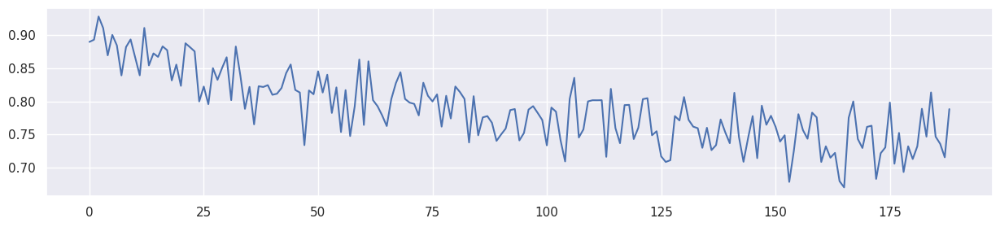

Mean F1 for all data: 0.7883910199922906
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: -0.000507] [G loss: 0.687072]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 0.240562] [G loss: 0.665188]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 0.219441] [G loss: 0.601813]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 0.203379] [G loss: 0.518101]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 0.235516] [G loss: 0.471684]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 0.267414] [G loss: 0.434988]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 0.198158] [G loss: 0.401109]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 0.264175] [G loss: 0.369357]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 0.174281] [G loss: 0.339106]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 0.232742] [G loss: 0.309984]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 0.266255] [G loss: 0.285848]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 0.291630] [G loss: 0.267960]
[Lambda: 0.100000] [Epoch 2400/4000] [mi loss: 0.2359

100%|██████████| 189/189 [00:00<00:00, 467.17it/s]


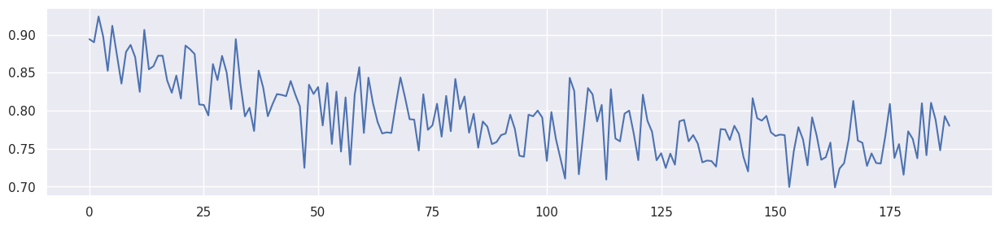

Mean F1 for all data: 0.7916139248805701
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: -0.000509] [G loss: 0.687072]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 0.306720] [G loss: 0.666019]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 0.278406] [G loss: 0.630813]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 0.248991] [G loss: 0.542647]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 0.261024] [G loss: 0.475924]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 0.219327] [G loss: 0.436228]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 0.225037] [G loss: 0.402053]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 0.223125] [G loss: 0.367904]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 0.183641] [G loss: 0.335754]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 0.211235] [G loss: 0.306140]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 0.242224] [G loss: 0.282007]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 0.300497] [G loss: 0.263659]
[Lambda: 0.200000] [Epoch 2400/4000] [mi loss: 0.2054

100%|██████████| 189/189 [00:00<00:00, 470.64it/s]


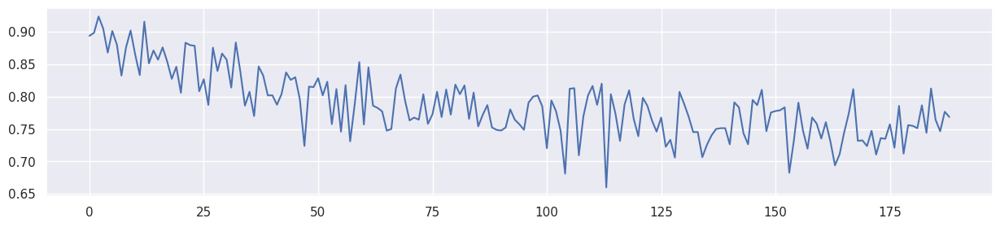

Mean F1 for all data: 0.7870858180739411
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: -0.000513] [G loss: 0.687072]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 0.235730] [G loss: 0.667361]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 0.260924] [G loss: 0.639280]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 0.238785] [G loss: 0.588981]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 0.230428] [G loss: 0.499827]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 0.239971] [G loss: 0.439118]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 0.251998] [G loss: 0.397584]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 0.233154] [G loss: 0.360681]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 0.225287] [G loss: 0.326299]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 0.183861] [G loss: 0.294217]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 0.259931] [G loss: 0.269352]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 0.240537] [G loss: 0.252563]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss: 0.2596

100%|██████████| 189/189 [00:00<00:00, 434.78it/s]


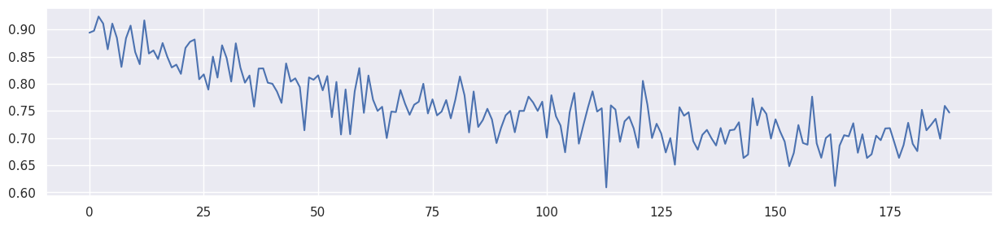

Mean F1 for all data: 0.7581437705257966
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: -0.000513] [G loss: 0.687072]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 0.242915] [G loss: 0.671926]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 0.248891] [G loss: 0.648737]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 0.238273] [G loss: 0.618804]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 0.212975] [G loss: 0.574836]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 0.271424] [G loss: 0.443338]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 0.217547] [G loss: 0.328786]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 0.223789] [G loss: 0.287412]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 0.267593] [G loss: 0.262652]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 0.312307] [G loss: 0.246814]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 0.200052] [G loss: 0.237606]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 0.251354] [G loss: 0.232042]
[Lambda: 0.400000] [Epoch 2400/4000] [mi loss: 0.2643

100%|██████████| 189/189 [00:00<00:00, 462.09it/s]


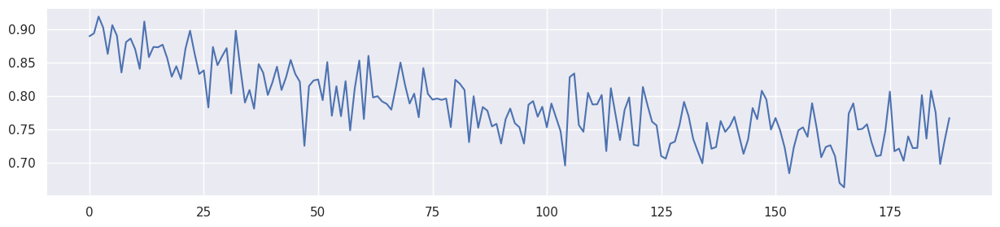

Mean F1 for all data: 0.7871555286469805
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: -0.000528] [G loss: 0.687072]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 0.213425] [G loss: 0.672400]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 0.254853] [G loss: 0.648279]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 0.249357] [G loss: 0.618136]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 0.242177] [G loss: 0.574087]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 0.223648] [G loss: 0.457607]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 0.209526] [G loss: 0.349157]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 0.265037] [G loss: 0.306203]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 0.267943] [G loss: 0.278191]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 0.178978] [G loss: 0.258577]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 0.240308] [G loss: 0.244107]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 0.235218] [G loss: 0.235965]
[Lambda: 0.500000] [Epoch 2400/4000] [mi loss: 0.2334

100%|██████████| 189/189 [00:00<00:00, 460.61it/s]


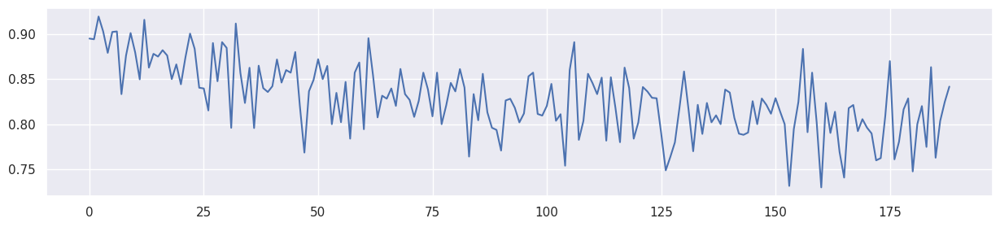

Mean F1 for all data: 0.8284478965724682
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: -0.000532] [G loss: 0.687072]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 0.238855] [G loss: 0.672509]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 0.287137] [G loss: 0.648019]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 0.278235] [G loss: 0.618085]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 0.254221] [G loss: 0.578114]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 0.239994] [G loss: 0.485003]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 0.249928] [G loss: 0.359393]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 0.288998] [G loss: 0.306120]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 0.223794] [G loss: 0.277541]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 0.230865] [G loss: 0.258307]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 0.220660] [G loss: 0.244725]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 0.245217] [G loss: 0.236360]
[Lambda: 0.600000] [Epoch 2400/4000] [mi loss: 0.2643

100%|██████████| 189/189 [00:00<00:00, 470.93it/s]


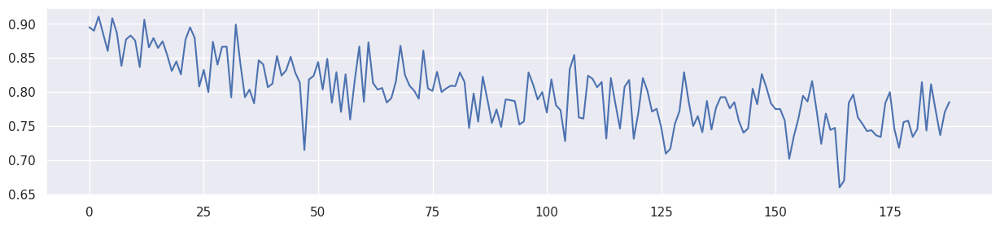

Mean F1 for all data: 0.7995182352364093
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: -0.000507] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.240660] [G loss: 0.672658]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 0.244190] [G loss: 0.647968]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 0.224043] [G loss: 0.618058]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 0.314439] [G loss: 0.581884]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 0.213649] [G loss: 0.525490]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 0.217920] [G loss: 0.413995]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 0.212781] [G loss: 0.323739]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 0.256979] [G loss: 0.284659]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 0.245612] [G loss: 0.260902]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 0.274405] [G loss: 0.245568]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 0.244562] [G loss: 0.236417]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 0.2643

100%|██████████| 189/189 [00:00<00:00, 469.40it/s]


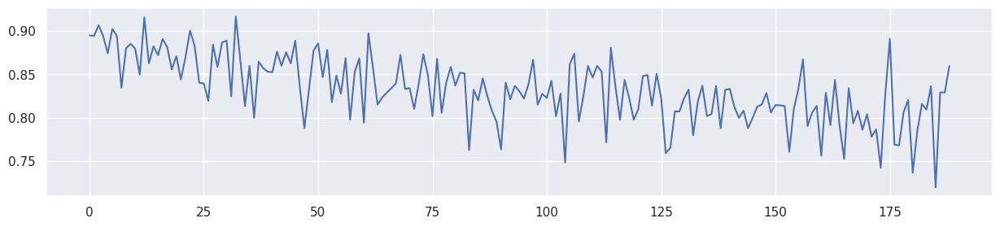

Mean F1 for all data: 0.8328276021537807
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: -0.000535] [G loss: 0.687072]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.231259] [G loss: 0.672722]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 0.255929] [G loss: 0.647951]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 0.265516] [G loss: 0.618388]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 0.236091] [G loss: 0.583729]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 0.251881] [G loss: 0.538667]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 0.258848] [G loss: 0.472233]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 0.247313] [G loss: 0.380413]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 0.249260] [G loss: 0.306917]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 0.244253] [G loss: 0.272716]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 0.307938] [G loss: 0.253549]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 0.237474] [G loss: 0.241622]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss: 0.2563

100%|██████████| 189/189 [00:00<00:00, 469.89it/s]


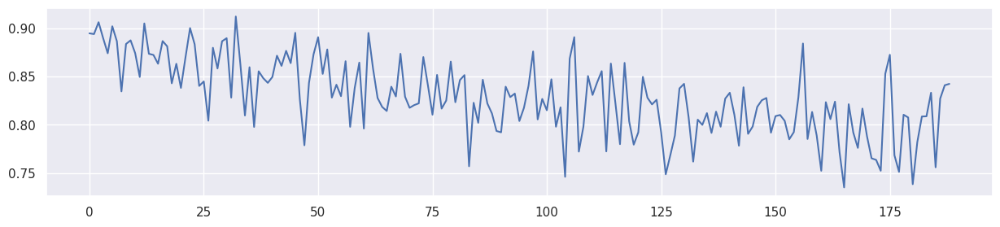

Mean F1 for all data: 0.8292547018555403
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: -0.000535] [G loss: 0.687072]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.245889] [G loss: 0.672733]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 0.245612] [G loss: 0.648066]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 0.250575] [G loss: 0.618935]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 0.193718] [G loss: 0.586022]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 0.260126] [G loss: 0.546760]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 0.254907] [G loss: 0.498813]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 0.252336] [G loss: 0.442854]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 0.270679] [G loss: 0.380965]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 0.290753] [G loss: 0.326142]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 0.284199] [G loss: 0.287856]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 0.261402] [G loss: 0.261974]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 0.2931

100%|██████████| 189/189 [00:00<00:00, 459.56it/s]


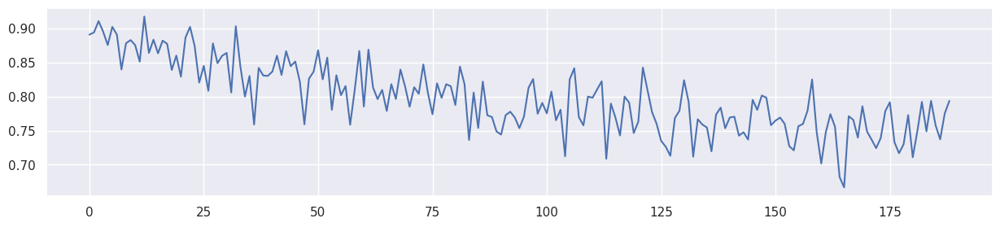

Mean F1 for all data: 0.7979042455885715


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


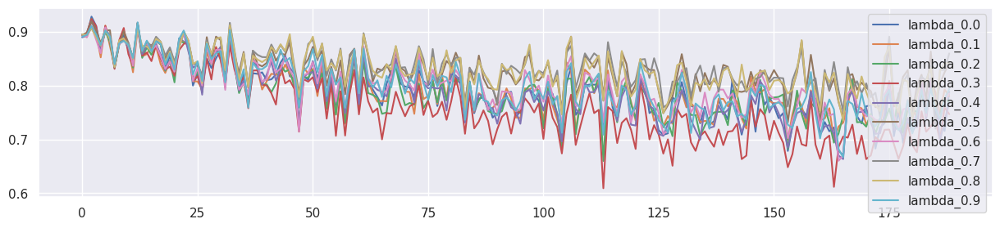

In [155]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.7]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model55(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.5)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])


+ 유효기간을 더 연장하다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 108.223732] [G loss: 0.663300]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 232.217194] [G loss: 0.572286]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 270.647522] [G loss: 0.512803]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 316.561584] [G loss: 0.471976]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 343.138428] [G loss: 0.436932]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 346.401672] [G loss: 0.405146]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 318.470428] [G loss: 0.374840]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 285.132294] [G loss: 0.344492]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 217.455383] [G loss: 0.315519]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 195.101349] [G loss: 0.290146]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 171.996613] [G loss: 0.270381]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 156.798401] [G loss: 0.25

100%|██████████| 189/189 [00:00<00:00, 475.47it/s]


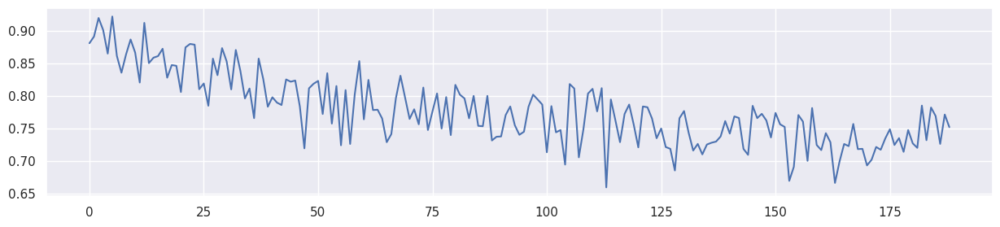

Mean F1 for all data: 0.7779682535510352
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 105.782974] [G loss: 0.663588]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 225.265274] [G loss: 0.571994]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 259.615234] [G loss: 0.512829]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 286.691711] [G loss: 0.472508]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 294.694855] [G loss: 0.436687]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 283.173492] [G loss: 0.381485]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 228.349579] [G loss: 0.346206]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 180.834564] [G loss: 0.316321]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 145.121674] [G loss: 0.290167]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 127.890663] [G loss: 0.271099]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 108.279808] [G loss: 0.257112]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 473.58it/s]


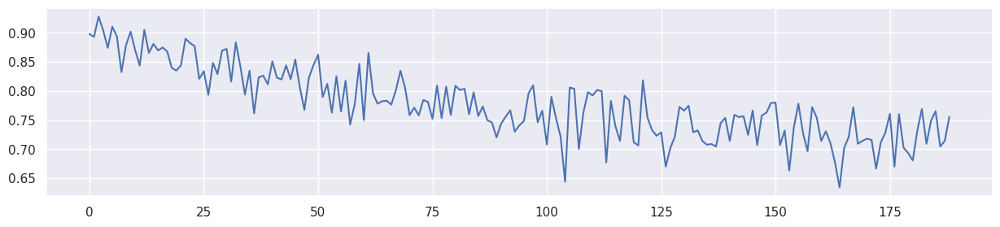

Mean F1 for all data: 0.7778330458109592
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 103.328072] [G loss: 0.664072]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 218.128754] [G loss: 0.572697]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 246.397980] [G loss: 0.513137]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 254.439133] [G loss: 0.473129]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 247.341202] [G loss: 0.437006]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 226.859207] [G loss: 0.402490]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 198.505615] [G loss: 0.369643]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 163.415558] [G loss: 0.338222]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 139.847107] [G loss: 0.308366]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 122.973656] [G loss: 0.284199]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 111.066978] [G loss: 0.265354]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 465.96it/s]


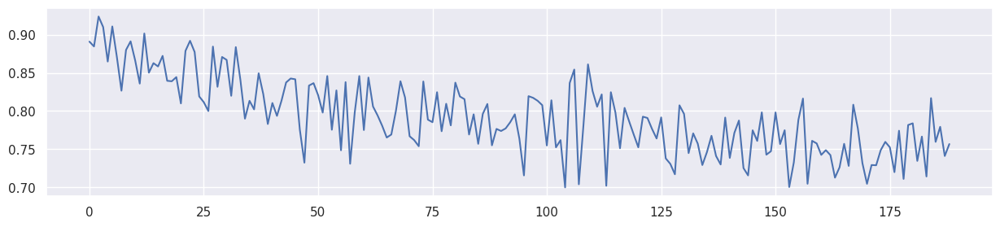

Mean F1 for all data: 0.7927712568245282
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 101.642685] [G loss: 0.664678]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 209.051315] [G loss: 0.573828]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 231.915314] [G loss: 0.513762]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 227.691666] [G loss: 0.473987]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 216.716309] [G loss: 0.437299]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 194.880768] [G loss: 0.401936]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 169.242859] [G loss: 0.368436]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 140.019257] [G loss: 0.336425]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 121.239120] [G loss: 0.306427]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 108.435928] [G loss: 0.281970]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 101.019974] [G loss: 0.263915]
[Lambda: 0.300000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 440.05it/s]


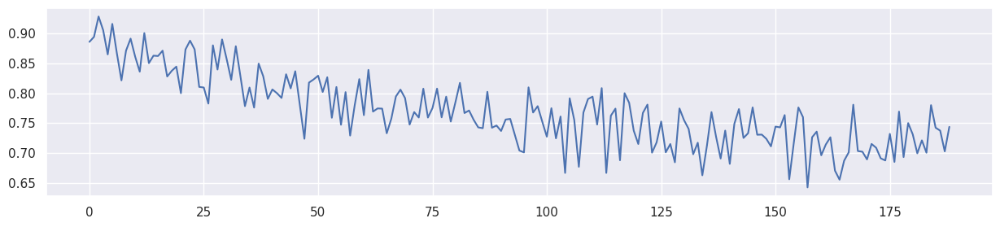

Mean F1 for all data: 0.7699571269153709
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 99.886414] [G loss: 0.665513]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 197.042358] [G loss: 0.576178]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 213.731094] [G loss: 0.514885]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 205.908340] [G loss: 0.475181]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 189.004288] [G loss: 0.438458]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 166.800385] [G loss: 0.401709]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 143.602219] [G loss: 0.367107]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 121.665749] [G loss: 0.334385]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 109.274399] [G loss: 0.303903]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 92.325531] [G loss: 0.279836]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 78.715942] [G loss: 0.259242]
[Lambda: 0.400000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 461.48it/s]


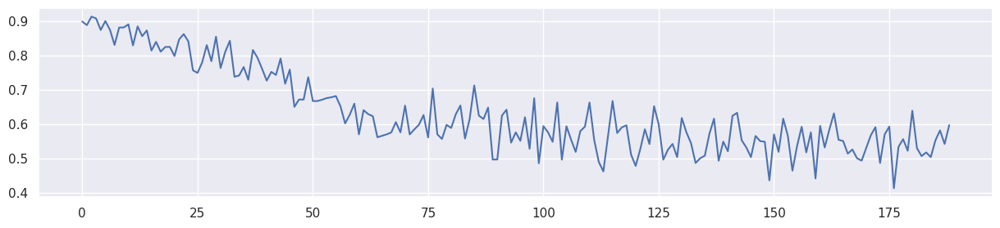

Mean F1 for all data: 0.6331894632164938
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 97.788910] [G loss: 0.666567]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 182.409668] [G loss: 0.579247]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 200.264328] [G loss: 0.516289]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 186.801193] [G loss: 0.477293]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.127426] [G loss: 0.440712]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 145.302277] [G loss: 0.401914]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 127.423004] [G loss: 0.365561]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 109.887291] [G loss: 0.332183]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 94.346069] [G loss: 0.300749]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 83.680840] [G loss: 0.274703]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 78.037819] [G loss: 0.256351]
[Lambda: 0.500000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 431.49it/s]


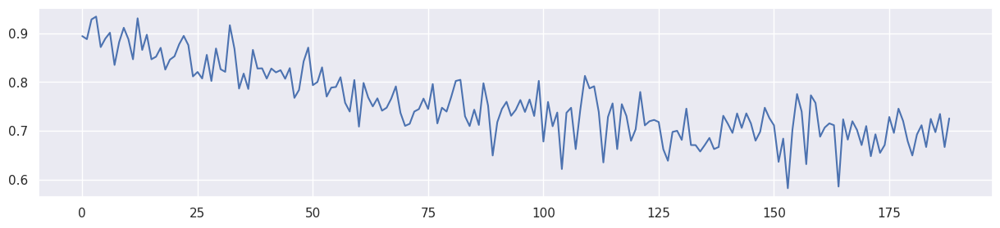

Mean F1 for all data: 0.7568396403825353
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 95.719437] [G loss: 0.668006]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 160.993851] [G loss: 0.591618]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 182.298553] [G loss: 0.520565]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 165.065598] [G loss: 0.480157]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 144.012253] [G loss: 0.440675]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 125.486458] [G loss: 0.400740]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 107.397926] [G loss: 0.362003]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 91.974678] [G loss: 0.324298]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.003479] [G loss: 0.290222]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 77.729340] [G loss: 0.265550]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 74.165131] [G loss: 0.248363]
[Lambda: 0.600000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 465.11it/s]


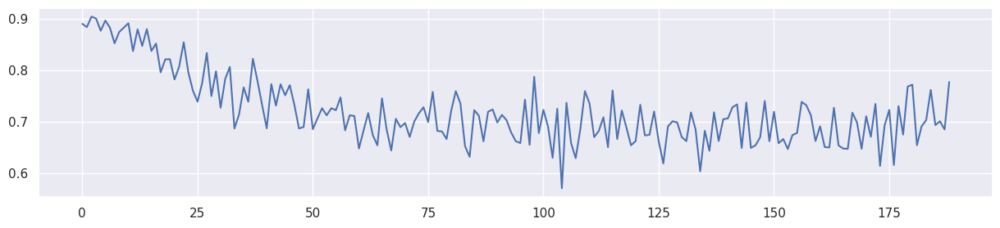

Mean F1 for all data: 0.7216854897379624
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.876526] [G loss: 0.669395]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 138.312439] [G loss: 0.607139]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 165.487610] [G loss: 0.528706]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.674301] [G loss: 0.484493]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.560982] [G loss: 0.440764]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.939095] [G loss: 0.396539]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.815247] [G loss: 0.352251]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.745514] [G loss: 0.311501]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.183800] [G loss: 0.279007]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.569450] [G loss: 0.256086]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.202301] [G loss: 0.241990]
[Lambda: 0.700000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 475.33it/s]


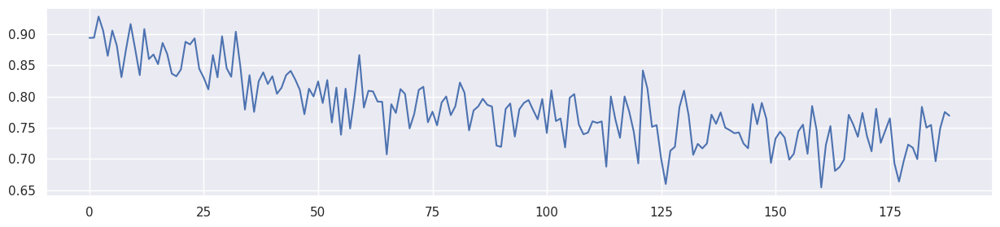

Mean F1 for all data: 0.782278294135506
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 92.723511] [G loss: 0.670305]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 89.146370] [G loss: 0.646817]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 85.495941] [G loss: 0.616318]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 81.624222] [G loss: 0.576955]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 77.460754] [G loss: 0.526441]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 73.326736] [G loss: 0.469271]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 69.668373] [G loss: 0.416513]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 66.685799] [G loss: 0.376129]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 64.369682] [G loss: 0.350362]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 62.601124] [G loss: 0.336253]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 61.196770] [G loss: 0.329088]
[Lambda: 0.800000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 454.70it/s]


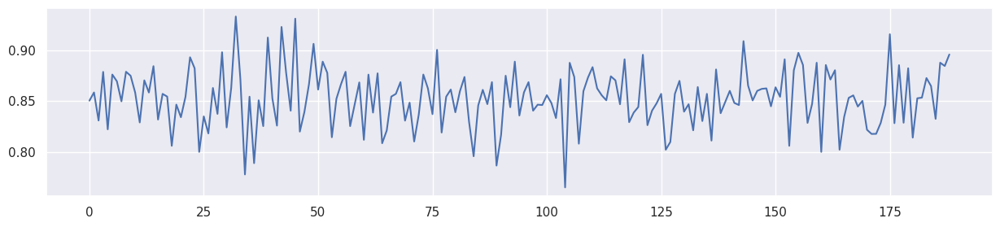

Mean F1 for all data: 0.8528047633954339
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 70.132034] [G loss: 0.675432]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 32.705696] [G loss: 0.643234]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 31.037699] [G loss: 0.611520]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.678391] [G loss: 0.543549]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 42.336670] [G loss: 0.347814]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 39.690559] [G loss: 0.289757]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 36.586475] [G loss: 0.263708]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 34.510918] [G loss: 0.249073]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 33.200043] [G loss: 0.240401]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 32.350662] [G loss: 0.234825]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 31.751562] [G loss: 0.231274]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 473.04it/s]


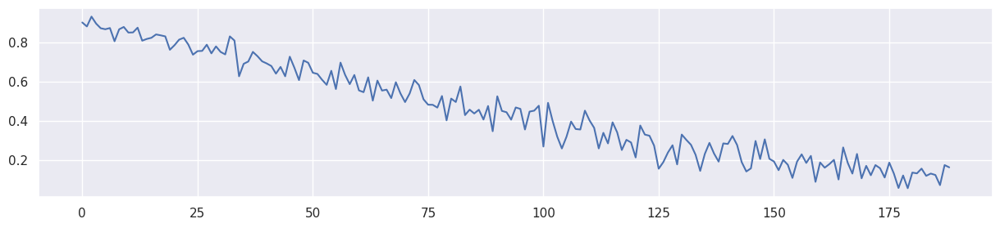

Mean F1 for all data: 0.4514556052932833


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


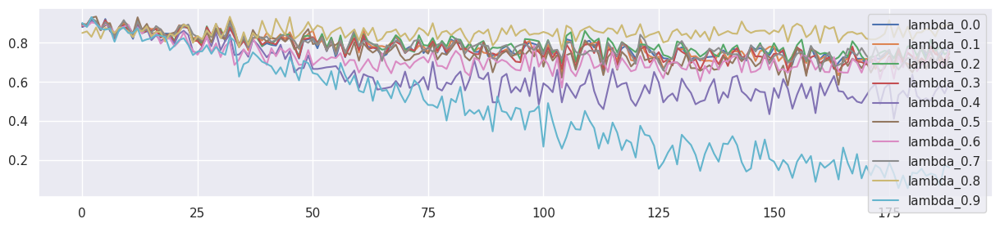

In [156]:
seed_everything()

train_result = []

avaible_range = 800

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



## D(G(x,b)) 구조

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 상기와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

In [157]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        
        for i in range(self.input_dim): 
            self.fc1.append(nn.Linear(2, 15))
            self.fc2.append(nn.Linear(15, 5))
            self.fc3.append(nn.Linear(5, 1))

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1)))
            h1 = F.relu(self.fc2[i](h0))
            h2 = self.fc3[i](h1)
            pxy.append(h2)
            
        return torch.cat(pxy, dim=1)

In [158]:

def test_model6(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [159]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model6(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):

    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model6(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [160]:
def test_all_data6(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 17.980030] [G loss: 0.596769]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 103.865044] [G loss: 0.384212]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 777.229370] [G loss: 0.235669]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 1144.657837] [G loss: 0.224541]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 1404.373779] [G loss: 0.221965]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 1661.917725] [G loss: 0.220283]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 1853.747070] [G loss: 0.218897]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 2002.128906] [G loss: 0.218023]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 2157.442871] [G loss: 0.217339]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 2296.124756] [G loss: 0.216702]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 2430.282959] [G loss: 0.216080]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 2568.322754] [G los

100%|██████████| 189/189 [00:00<00:00, 366.54it/s]


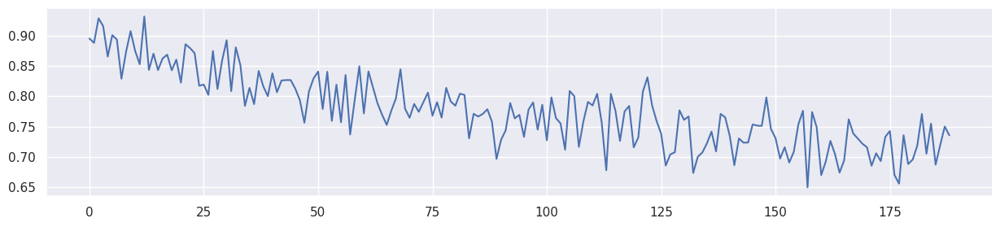

Mean F1 for all data: 0.7770167275668007
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 17.671614] [G loss: 0.596653]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 94.161751] [G loss: 0.386753]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 280.699249] [G loss: 0.242669]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 243.463470] [G loss: 0.229314]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 204.021164] [G loss: 0.225861]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 177.966751] [G loss: 0.223738]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 157.405960] [G loss: 0.222458]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 138.621643] [G loss: 0.221641]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 123.444611] [G loss: 0.220886]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 110.907829] [G loss: 0.220168]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 100.527946] [G loss: 0.219337]
[Lambda: 0.100000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 367.76it/s]


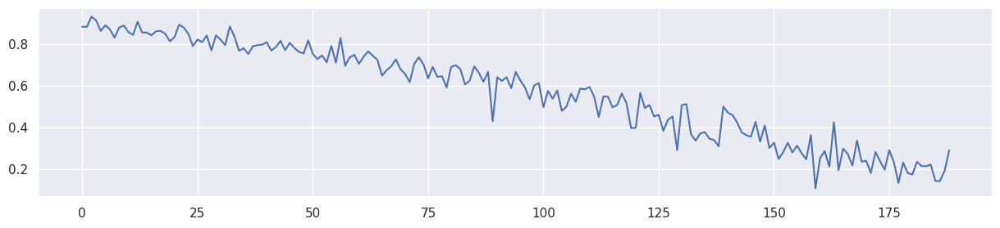

Mean F1 for all data: 0.5699322994084851
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 17.332769] [G loss: 0.596561]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 73.340462] [G loss: 0.391541]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 196.322266] [G loss: 0.246693]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 167.068695] [G loss: 0.231877]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 137.177216] [G loss: 0.227621]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 116.831085] [G loss: 0.225276]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 101.067986] [G loss: 0.223742]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 88.529144] [G loss: 0.222526]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 77.966400] [G loss: 0.221357]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 69.563545] [G loss: 0.220232]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 62.323563] [G loss: 0.219389]
[Lambda: 0.200000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 363.05it/s]


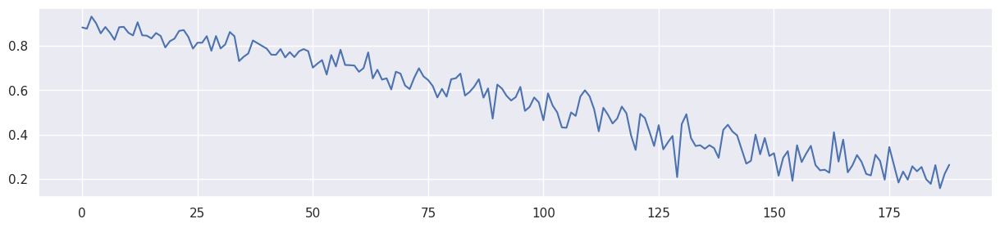

Mean F1 for all data: 0.5530981769242438
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 16.904823] [G loss: 0.596439]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 61.775570] [G loss: 0.395787]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 151.534271] [G loss: 0.251501]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 126.668709] [G loss: 0.235026]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 104.070061] [G loss: 0.229714]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 88.777084] [G loss: 0.226454]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 76.546127] [G loss: 0.224253]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 66.837524] [G loss: 0.222517]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 58.849876] [G loss: 0.221297]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 52.330841] [G loss: 0.220228]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 46.884010] [G loss: 0.219257]
[Lambda: 0.300000] [Epoch 2400/4000] [mi

100%|██████████| 189/189 [00:00<00:00, 367.15it/s]


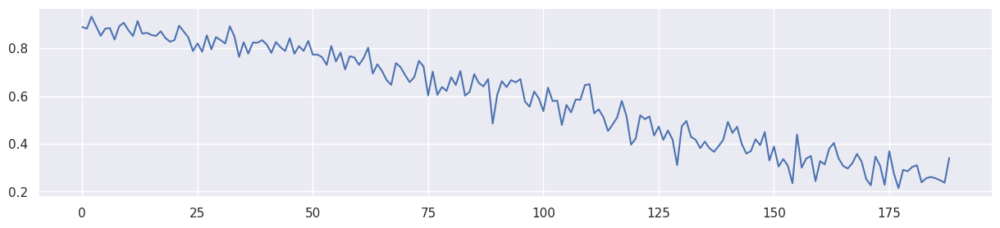

Mean F1 for all data: 0.5913215139341794
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 16.369711] [G loss: 0.596333]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 52.915394] [G loss: 0.400262]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 117.403267] [G loss: 0.258504]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 99.491104] [G loss: 0.238708]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 80.638000] [G loss: 0.231716]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 59.324238] [G loss: 0.225724]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 46.809055] [G loss: 0.223126]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 38.970161] [G loss: 0.221629]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 33.358315] [G loss: 0.220576]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 29.321375] [G loss: 0.219339]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 25.983192] [G loss: 0.218339]
[Lambda: 0.400000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 360.10it/s]


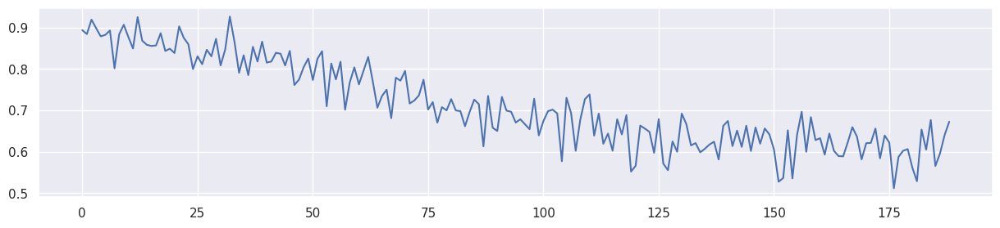

Mean F1 for all data: 0.7134846269574555
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 15.672554] [G loss: 0.596224]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 45.974957] [G loss: 0.404205]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 91.451920] [G loss: 0.268616]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 79.491974] [G loss: 0.243332]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 59.896770] [G loss: 0.231324]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 45.056599] [G loss: 0.225555]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 36.455544] [G loss: 0.223031]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 30.798449] [G loss: 0.221318]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 26.618702] [G loss: 0.220059]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 23.531939] [G loss: 0.218925]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 21.166861] [G loss: 0.217814]
[Lambda: 0.500000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 356.45it/s]


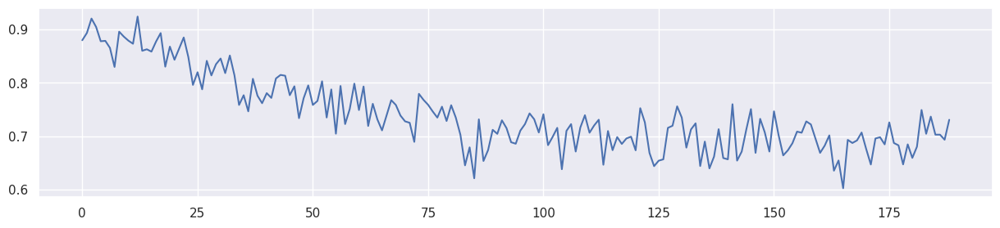

Mean F1 for all data: 0.7409717968188498
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 14.807113] [G loss: 0.596108]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 39.529762] [G loss: 0.409624]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 66.986115] [G loss: 0.286936]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 60.322033] [G loss: 0.245182]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 44.115467] [G loss: 0.232556]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 35.441658] [G loss: 0.227350]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 29.560139] [G loss: 0.224556]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 25.387522] [G loss: 0.222630]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 22.405470] [G loss: 0.220920]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 20.024099] [G loss: 0.219320]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 18.114914] [G loss: 0.217490]
[Lambda: 0.600000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 359.39it/s]


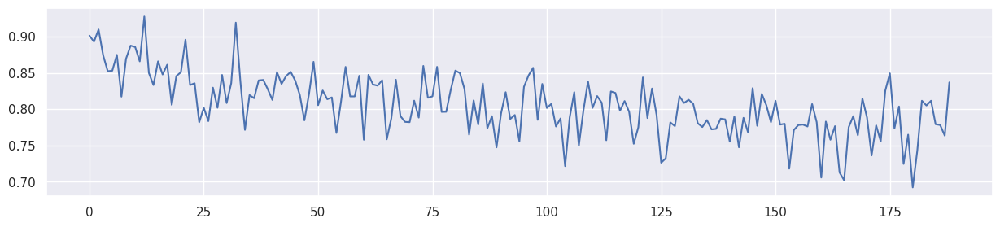

Mean F1 for all data: 0.8067054370413038
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 13.617666] [G loss: 0.596776]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 32.704388] [G loss: 0.417213]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 48.282948] [G loss: 0.299465]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 39.396454] [G loss: 0.253353]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 30.242971] [G loss: 0.238300]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 24.139223] [G loss: 0.231717]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 19.969759] [G loss: 0.226973]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 16.890461] [G loss: 0.224048]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 14.669289] [G loss: 0.221743]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 12.929133] [G loss: 0.219616]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 11.507439] [G loss: 0.217761]
[Lambda: 0.700000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 340.50it/s]


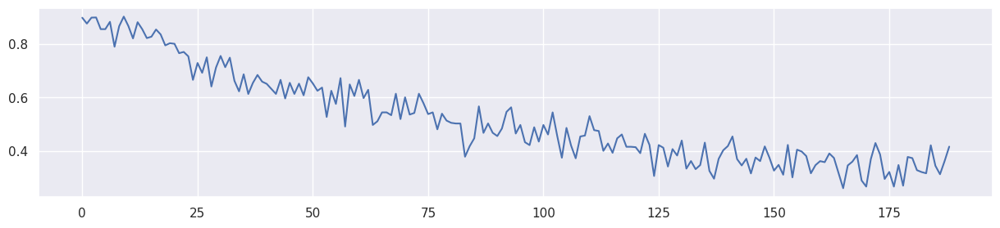

Mean F1 for all data: 0.519669163843853
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 11.579732] [G loss: 0.601641]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 26.170527] [G loss: 0.425187]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 34.218678] [G loss: 0.316146]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 29.779964] [G loss: 0.266774]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 23.389132] [G loss: 0.244175]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 18.674093] [G loss: 0.233971]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 15.373769] [G loss: 0.228698]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 13.077997] [G loss: 0.224937]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 11.394029] [G loss: 0.222389]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 10.088346] [G loss: 0.220490]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 9.017919] [G loss: 0.219056]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss

100%|██████████| 189/189 [00:00<00:00, 364.39it/s]


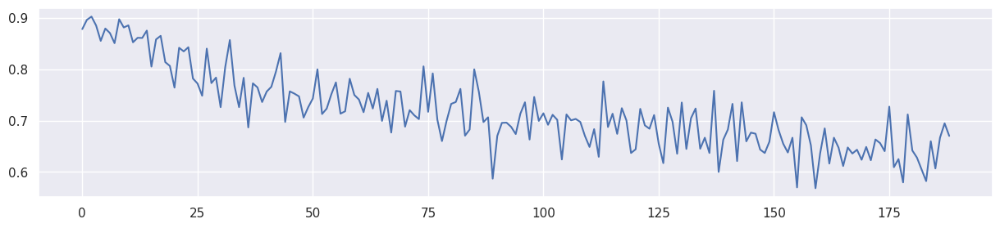

Mean F1 for all data: 0.7186484731314433
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 2.857229] [G loss: 0.661478]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 10.366017] [G loss: 0.512024]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 16.259233] [G loss: 0.362870]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 15.216691] [G loss: 0.290268]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 12.729938] [G loss: 0.260437]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 10.722061] [G loss: 0.245058]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 9.034911] [G loss: 0.236578]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 7.717806] [G loss: 0.231457]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 6.670519] [G loss: 0.227445]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 5.833495] [G loss: 0.224127]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 5.203950] [G loss: 0.221217]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 4.

100%|██████████| 189/189 [00:00<00:00, 338.41it/s]


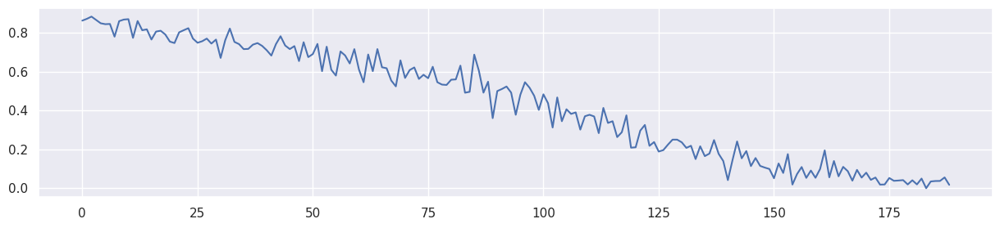

Mean F1 for all data: 0.43950724768127414


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.879630,0.709874,0.620370,0.245552
1,Feature 6,0.872093,0.887850,0.086206,0.000000,0.231248
2,Feature 4,0.784091,0.876712,0.851969,0.886878,0.103256
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.731976,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752758,0.688073,0.230407


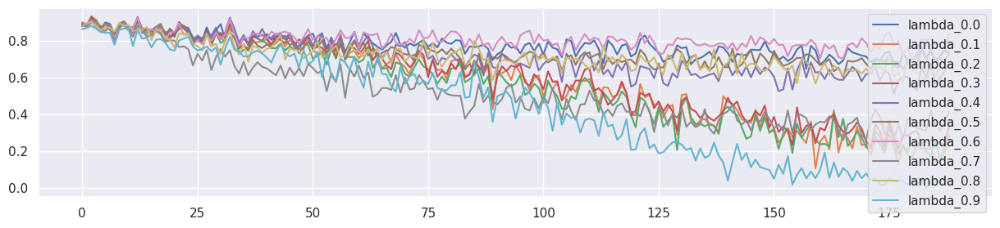

In [161]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.6]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model6(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000517)
    result_table[f'lambda_{lambda_f}'] = test_all_data6(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])

